# Using nighttime lights, land cover, and net primary production to monitor regional economic development from above

## Install Packages

In [1]:
import pandas as pd
# import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from pandasgui import show

## Preliminaries

In [2]:
# Set path
path = "/Users/Jesson Pagaduan/Google Drive/Geospatial_Project/"

## Regional GDP

In [3]:
df_gdp = pd.read_csv(path + "data/scratch/data_16Apr.csv", index_col=False,
                     usecols=['YEAR', 'REGION', 'ZONE_CODE', 'GDP', 'GDP_AGR', 'GDP_IND', 
                              'GDP_SVC', 'GDPpc'], parse_dates=['YEAR'])
df_gdp.columns = [i.lower() for i in df_gdp.columns]

In [4]:
df_gdp = df_gdp.assign(gdp_non_agr = lambda x: x.gdp_ind + x.gdp_svc,
                       log_gdp = lambda x: np.log(x.gdp),
                       log_gdp_agr = lambda x: np.log(x.gdp_agr),
                       log_gdp_ind = lambda x: np.log(x.gdp_ind),
                       log_gdp_svc = lambda x: np.log(x.gdp_svc),
                       log_gdp_non_agr = lambda x: np.log(x.gdp_non_agr),
                       log_gdppc = lambda x: np.log(x.gdppc))

C:\Users\Jesson Pagaduan\Anaconda3\lib\site-packages\pandas\core\series.py:726: RuntimeWarning:

divide by zero encountered in log



In [5]:
gdp_growth = pd.DataFrame(df_gdp.set_index(['region', 'year']).groupby('zone_code').pct_change() * 100).reset_index()

In [6]:
df_gdp = df_gdp.set_index(['region', 'year']).join(gdp_growth.set_index(['region', 'year']), rsuffix='_gr').reset_index()

In [7]:
df_gdp.drop(columns=['log_gdp_gr', 'log_gdp_agr_gr', 'log_gdp_ind_gr', 'log_gdp_svc_gr', 
                     'log_gdp_non_agr_gr', 'log_gdppc_gr'], inplace=True)

In [8]:
df_gdp_p1 = df_gdp[df_gdp['year'] < '2009-01-01']
df_gdp_p2 = df_gdp[df_gdp['year'] >= '2009-01-01']

### Sample: 2000-2008

#### Regional GDP levels

In [9]:
#  Average GDP per region, highest to lowest
top_ave_gdp_p1 = df_gdp_p1.groupby(['region']).mean().sort_values(by='log_gdp', ascending=False)[['zone_code', 'log_gdp']]
top_ave_gdp_p1

,zone_code,log_gdp
region,,
Metropolitan Manila,13,12.806820
Central Luzon (Region III),6,11.518371
Western Visayas (Region VI),16,11.325552
Central Visayas (Region VII),7,11.313934
Davao Region (Region XI),9,10.945464
Northern Mindanao (Region X),14,10.892640
SOCCSKSARGEN (Region XII),15,10.551836
Ilocos Region (Region I),11,10.449840
Bicol Region (Region V),2,10.392438


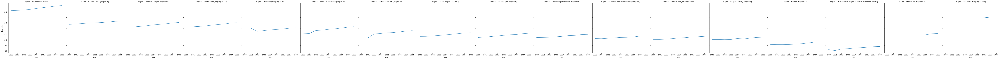

In [11]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp', col='region', kind='line', 
            col_order=top_ave_gdp_p1.index)

In [12]:
#  Average agri GDP per region, highest to lowest
top_ave_gdp_p1_agr = df_gdp_p1.groupby(['region']).mean().sort_values(by='log_gdp_agr', ascending=False)[['zone_code', 'log_gdp_agr']]
top_ave_gdp_p1_agr

,zone_code,log_gdp_agr
region,,
Central Luzon (Region III),6,10.102803
Western Visayas (Region VI),16,10.033724
Davao Region (Region XI),9,9.701783
Northern Mindanao (Region X),14,9.668482
SOCCSKSARGEN (Region XII),15,9.659219
Zamboanga Peninsula (Region IX),17,9.641434
Ilocos Region (Region I),11,9.585821
Cagayan Valley (Region II),4,9.423833
Bicol Region (Region V),2,9.279167


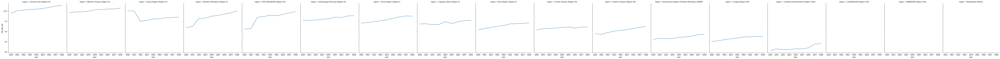

In [13]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_agr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_agr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_agr.index)

In [14]:
#  Average industry GDP per region, highest to lowest
top_ave_gdp_p1_ind = df_gdp_p1.groupby(['region']).mean().sort_values(by='log_gdp_ind', ascending=False)[['zone_code', 'log_gdp_ind']]
top_ave_gdp_p1_ind

,zone_code,log_gdp_ind
region,,
Metropolitan Manila,13,11.781792
Central Luzon (Region III),6,10.542100
Central Visayas (Region VII),7,10.127802
Western Visayas (Region VI),16,9.972479
Cordillera Administrative Region (CAR),8,9.759930
Davao Region (Region XI),9,9.756642
Northern Mindanao (Region X),14,9.737584
SOCCSKSARGEN (Region XII),15,9.408918
Eastern Visayas (Region VIII),10,8.995578


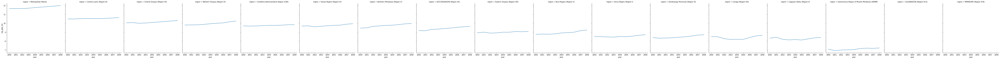

In [15]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_ind.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_ind', col='region', kind='line', 
            col_order=top_ave_gdp_p1_ind.index)

In [16]:
#  Average service GDP per region, highest to lowest
top_ave_gdp_p1_svc = df_gdp_p1.groupby(['region']).mean().sort_values(by='log_gdp_svc', ascending=False)[['zone_code', 'log_gdp_svc']]
top_ave_gdp_p1_svc

,zone_code,log_gdp_svc
region,,
Metropolitan Manila,13,12.362901
Central Visayas (Region VII),7,10.765749
Western Visayas (Region VI),16,10.564598
Central Luzon (Region III),6,10.553715
Davao Region (Region XI),9,10.043401
Northern Mindanao (Region X),14,9.955530
Ilocos Region (Region I),11,9.608164
Bicol Region (Region V),2,9.571963
SOCCSKSARGEN (Region XII),15,9.244536


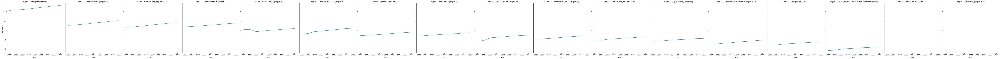

In [17]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_svc.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_svc', col='region', kind='line', 
            col_order=top_ave_gdp_p1_svc.index)

In [18]:
#  Average non-agri GDP per region, highest to lowest
top_ave_gdp_p1_non_agr = df_gdp_p1.groupby(['region']).mean().sort_values(by='log_gdp_non_agr', ascending=False)[['zone_code', 'log_gdp_non_agr']]
top_ave_gdp_p1_non_agr

,zone_code,log_gdp_non_agr
region,,
Metropolitan Manila,13,12.807656
Central Luzon (Region III),6,11.242046
Central Visayas (Region VII),7,11.190955
Western Visayas (Region VI),16,11.005145
Davao Region (Region XI),9,10.603743
Northern Mindanao (Region X),14,10.545806
Cordillera Administrative Region (CAR),8,10.067059
SOCCSKSARGEN (Region XII),15,10.023861
Bicol Region (Region V),2,9.997141


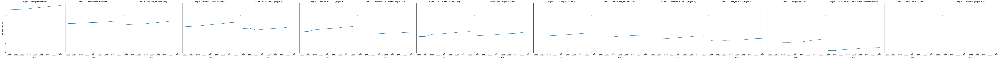

In [19]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_non_agr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_non_agr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_non_agr.index)

In [20]:
#  Average per capita GDP per region, highest to lowest
top_ave_gdppc_p1 = df_gdp_p1.groupby(['region']).mean().sort_values(by='log_gdppc', ascending=False)[['zone_code', 'log_gdppc']]
top_ave_gdppc_p1

,zone_code,log_gdppc
region,,
Metropolitan Manila,13,10.442957
Cordillera Administrative Region (CAR),8,9.807826
CALABARZON (Region IV-A),3,9.582601
Northern Mindanao (Region X),14,9.575512
Davao Region (Region XI),9,9.531737
Central Visayas (Region VII),7,9.485659
MIMAROPA (Region IV-B),12,9.479162
Western Visayas (Region VI),16,9.419679
Central Luzon (Region III),6,9.323460


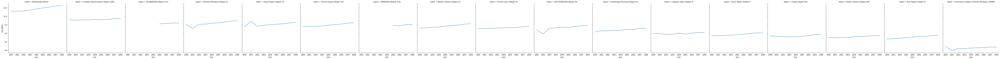

In [21]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdppc_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdppc', col='region', kind='line', 
            col_order=top_ave_gdppc_p1.index)

#### Regional GDP growth

In [22]:
#  Average GDP growth per region, highest to lowest
top_ave_gdp_p1_gr = df_gdp_p1.groupby(['region']).mean().sort_values(by='gdp_gr', ascending=False)[['zone_code', 'gdp_gr']]
top_ave_gdp_p1_gr

,zone_code,gdp_gr
region,,
MIMAROPA (Region IV-B),12,inf
CALABARZON (Region IV-A),3,inf
SOCCSKSARGEN (Region XII),15,9.285572
Northern Mindanao (Region X),14,8.611107
Metropolitan Manila,13,5.851850
Western Visayas (Region VI),16,5.271000
Central Visayas (Region VII),7,4.989557
Bicol Region (Region V),2,4.870073
Ilocos Region (Region I),11,4.166422


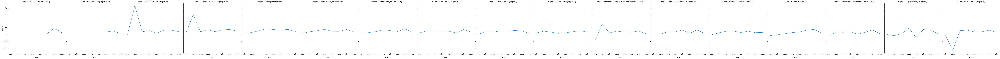

In [23]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_gr.index)

In [24]:
#  Average agri GDP growth per region, highest to lowest
top_ave_gdp_p1_agr_gr = df_gdp_p1.groupby(['region']).mean().sort_values(by='gdp_agr_gr', ascending=False)[['zone_code', 'gdp_agr_gr']]
top_ave_gdp_p1_agr_gr

,zone_code,gdp_agr_gr
region,,
SOCCSKSARGEN (Region XII),15,13.157696
Northern Mindanao (Region X),14,11.615677
Central Luzon (Region III),6,4.921657
Cordillera Administrative Region (CAR),8,4.574782
Eastern Visayas (Region VIII),10,4.526498
Ilocos Region (Region I),11,4.406646
Bicol Region (Region V),2,4.372518
Autonomous Region of Muslim Mindanao (ARMM),1,3.138869
Caraga (Region XIII),5,3.047354


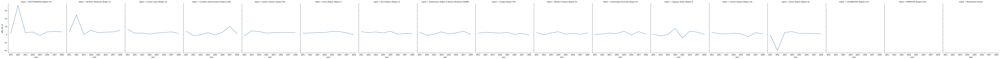

In [25]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_agr_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_agr_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_agr_gr.index)

In [26]:
#  Average industry GDP growth per region, highest to lowest
top_ave_gdp_p1_ind_gr = df_gdp_p1.groupby(['region']).mean().sort_values(by='gdp_ind_gr', ascending=False)[['zone_code', 'gdp_ind_gr']]
top_ave_gdp_p1_ind_gr

,zone_code,gdp_ind_gr
region,,
Northern Mindanao (Region X),14,6.826427
Bicol Region (Region V),2,6.287897
SOCCSKSARGEN (Region XII),15,6.165143
Western Visayas (Region VI),16,5.830234
Metropolitan Manila,13,4.342946
Zamboanga Peninsula (Region IX),17,4.067330
Davao Region (Region XI),9,3.527929
Central Visayas (Region VII),7,3.288532
Caraga (Region XIII),5,2.487342


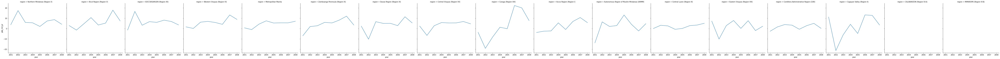

In [27]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_ind_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_ind_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_ind_gr.index)

In [28]:
#  Average service GDP growth per region, highest to lowest
top_ave_gdp_p1_svc_gr = df_gdp_p1.groupby(['region']).mean().sort_values(by='gdp_svc_gr', ascending=False)[['zone_code', 'gdp_svc_gr']]
top_ave_gdp_p1_svc_gr

,zone_code,gdp_svc_gr
region,,
SOCCSKSARGEN (Region XII),15,8.364246
Northern Mindanao (Region X),14,8.017753
Metropolitan Manila,13,6.746551
Central Visayas (Region VII),7,6.608787
Western Visayas (Region VI),16,6.381391
Cordillera Administrative Region (CAR),8,5.389945
Autonomous Region of Muslim Mindanao (ARMM),1,4.998199
Central Luzon (Region III),6,4.995777
Ilocos Region (Region I),11,4.654781


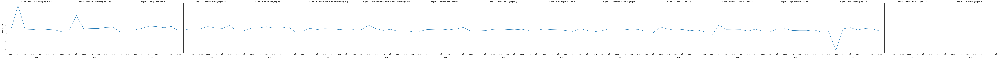

In [29]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_svc_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_svc_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_svc_gr.index)

In [30]:
#  Average agri GDP growth per region, highest to lowest
top_ave_gdp_p1_non_agr_gr = df_gdp_p1.groupby(['region']).mean().sort_values(by='gdp_non_agr_gr', ascending=False)[['zone_code', 'gdp_non_agr_gr']]
top_ave_gdp_p1_non_agr_gr

,zone_code,gdp_non_agr_gr
region,,
Northern Mindanao (Region X),14,7.472615
SOCCSKSARGEN (Region XII),15,7.087600
Western Visayas (Region VI),16,6.158460
Metropolitan Manila,13,5.851730
Central Visayas (Region VII),7,5.397279
Bicol Region (Region V),2,5.120645
Zamboanga Peninsula (Region IX),17,4.332678
Autonomous Region of Muslim Mindanao (ARMM),1,4.088268
Ilocos Region (Region I),11,4.005538


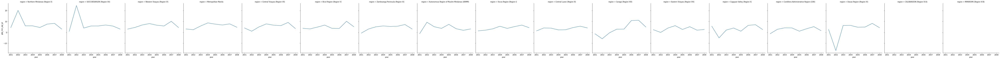

In [31]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdp_p1_non_agr_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_non_agr_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p1_non_agr_gr.index)

In [32]:
#  Average per capita GDP growth per region, highest to lowest
top_ave_gdppc_p1_gr = df_gdp_p1.groupby(['region']).mean().sort_values(by='gdppc_gr', ascending=False)[['zone_code', 'gdppc_gr']]
top_ave_gdppc_p1_gr

,zone_code,gdppc_gr
region,,
SOCCSKSARGEN (Region XII),15,4.358420
Metropolitan Manila,13,4.272964
Davao Region (Region XI),9,4.267151
Northern Mindanao (Region X),14,3.629397
Western Visayas (Region VI),16,3.213319
Central Visayas (Region VII),7,2.840117
Bicol Region (Region V),2,2.810650
Zamboanga Peninsula (Region IX),17,2.592035
MIMAROPA (Region IV-B),12,2.094515


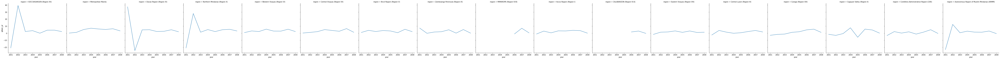

In [33]:
df = df_gdp_p1[df_gdp_p1['region'].isin(top_ave_gdppc_p1_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdppc_gr', col='region', kind='line', 
            col_order=top_ave_gdppc_p1_gr.index)

### Sample: 2009-2018

#### Regional GDP levels

In [34]:
#  Average GDP per region, highest to lowest
top_ave_gdp_p2 = df_gdp_p2.groupby(['region']).mean().sort_values(by='log_gdp', ascending=False)[['zone_code', 'log_gdp']]
top_ave_gdp_p2

,zone_code,log_gdp
region,,
Metropolitan Manila,13,14.737289
CALABARZON (Region IV-A),3,13.994444
Central Luzon (Region III),6,13.380999
Central Visayas (Region VII),7,12.983289
Western Visayas (Region VI),16,12.543531
Davao Region (Region XI),9,12.531128
Northern Mindanao (Region X),14,12.470226
Ilocos Region (Region I),11,12.296397
SOCCSKSARGEN (Region XII),15,12.143633


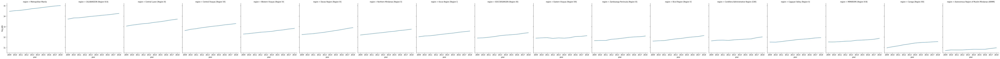

In [35]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp', col='region', kind='line', 
            col_order=top_ave_gdp_p2.index)

In [36]:
#  Average agri GDP per region, highest to lowest
top_ave_gdp_p2_agr = df_gdp_p2.groupby(['region']).mean().sort_values(by='log_gdp_agr', ascending=False)[['zone_code', 'log_gdp_agr']]
top_ave_gdp_p2_agr

,zone_code,log_gdp_agr
region,,
Central Luzon (Region III),6,11.578839
CALABARZON (Region IV-A),3,11.158320
Western Visayas (Region VI),16,11.038567
Northern Mindanao (Region X),14,11.035768
SOCCSKSARGEN (Region XII),15,10.844728
Ilocos Region (Region I),11,10.820007
Cagayan Valley (Region II),4,10.729007
Davao Region (Region XI),9,10.639746
Bicol Region (Region V),2,10.376869


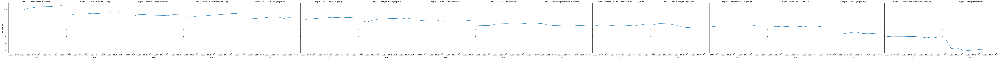

In [37]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_agr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_agr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_agr.index)

In [38]:
#  Average industry GDP per region, highest to lowest
top_ave_gdp_p2_ind = df_gdp_p2.groupby(['region']).mean().sort_values(by='log_gdp_ind', ascending=False)[['zone_code', 'log_gdp_ind']]
top_ave_gdp_p2_ind

,zone_code,log_gdp_ind
region,,
CALABARZON (Region IV-A),3,13.510487
Metropolitan Manila,13,13.037285
Central Luzon (Region III),6,12.538777
Central Visayas (Region VII),7,11.988390
Davao Region (Region XI),9,11.423770
Northern Mindanao (Region X),14,11.385461
Cordillera Administrative Region (CAR),8,11.134516
Eastern Visayas (Region VIII),10,11.104934
SOCCSKSARGEN (Region XII),15,11.061786


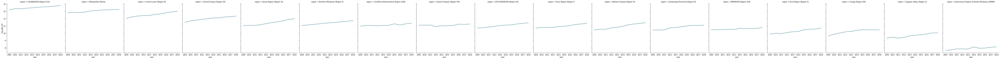

In [39]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_ind.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_ind', col='region', kind='line', 
            col_order=top_ave_gdp_p2_ind.index)

In [40]:
#  Average service GDP per region, highest to lowest
top_ave_gdp_p2_svc = df_gdp_p2.groupby(['region']).mean().sort_values(by='log_gdp_svc', ascending=False)[['zone_code', 'log_gdp_svc']]
top_ave_gdp_p2_svc

,zone_code,log_gdp_svc
region,,
Metropolitan Manila,13,14.532344
CALABARZON (Region IV-A),3,12.869121
Central Luzon (Region III),6,12.468350
Central Visayas (Region VII),7,12.408235
Western Visayas (Region VI),16,11.987786
Davao Region (Region XI),9,11.862348
Northern Mindanao (Region X),14,11.608315
Ilocos Region (Region I),11,11.603038
Bicol Region (Region V),2,11.279685


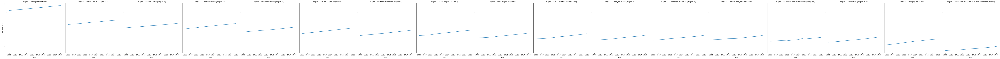

In [41]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_svc.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_svc', col='region', kind='line', 
            col_order=top_ave_gdp_p2_svc.index)

In [42]:
#  Average non-agri GDP per region, highest to lowest
top_ave_gdp_p2_non_agr = df_gdp_p2.groupby(['region']).mean().sort_values(by='log_gdp_non_agr', ascending=False)[['zone_code', 'log_gdp_non_agr']]
top_ave_gdp_p2_non_agr

,zone_code,log_gdp_non_agr
region,,
Metropolitan Manila,13,14.734852
CALABARZON (Region IV-A),3,13.933572
Central Luzon (Region III),6,13.199430
Central Visayas (Region VII),7,12.913866
Davao Region (Region XI),9,12.362126
Western Visayas (Region VI),16,12.287609
Northern Mindanao (Region X),14,12.196294
Ilocos Region (Region I),11,12.033870
SOCCSKSARGEN (Region XII),15,11.820483


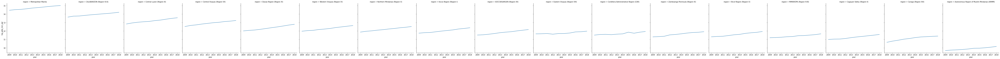

In [43]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_non_agr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdp_non_agr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_non_agr.index)

In [44]:
#  Average per capita GDP per region, highest to lowest
top_ave_gdppc_p2 = df_gdp_p2.groupby(['region']).mean().sort_values(by='log_gdppc', ascending=False)[['zone_code', 'log_gdppc']]
top_ave_gdppc_p2

,zone_code,log_gdppc
region,,
Metropolitan Manila,13,12.212884
CALABARZON (Region IV-A),3,11.373687
Cordillera Administrative Region (CAR),8,11.231581
Central Visayas (Region VII),7,11.001166
Central Luzon (Region III),6,10.998467
Davao Region (Region XI),9,10.961100
Northern Mindanao (Region X),14,10.945851
Ilocos Region (Region I),11,10.685926
SOCCSKSARGEN (Region XII),15,10.649501


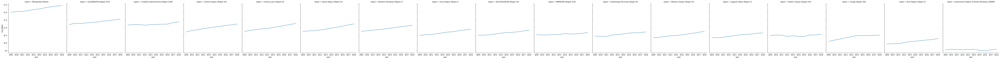

In [45]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdppc_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_gdppc', col='region', kind='line', 
            col_order=top_ave_gdppc_p2.index)

#### Regional GDP growth

In [46]:
# Exclude 2009 from growth analysis
df_gdp_p2 = df_gdp_p2[df_gdp_p2['year'] > '2009-01-01']

In [47]:
#  Average GDP growth per region, highest to lowest
top_ave_gdp_p2_gr = df_gdp_p2.groupby(['region']).mean().sort_values(by='gdp_gr', ascending=False)[['zone_code', 'gdp_gr']]
top_ave_gdp_p2_gr

,zone_code,gdp_gr
region,,
Central Visayas (Region VII),7,7.830527
Davao Region (Region XI),9,7.713048
Central Luzon (Region III),6,7.696741
Caraga (Region XIII),5,6.898735
Metropolitan Manila,13,6.390067
Northern Mindanao (Region X),14,6.368651
CALABARZON (Region IV-A),3,6.299168
Ilocos Region (Region I),11,6.229790
Western Visayas (Region VI),16,6.186100


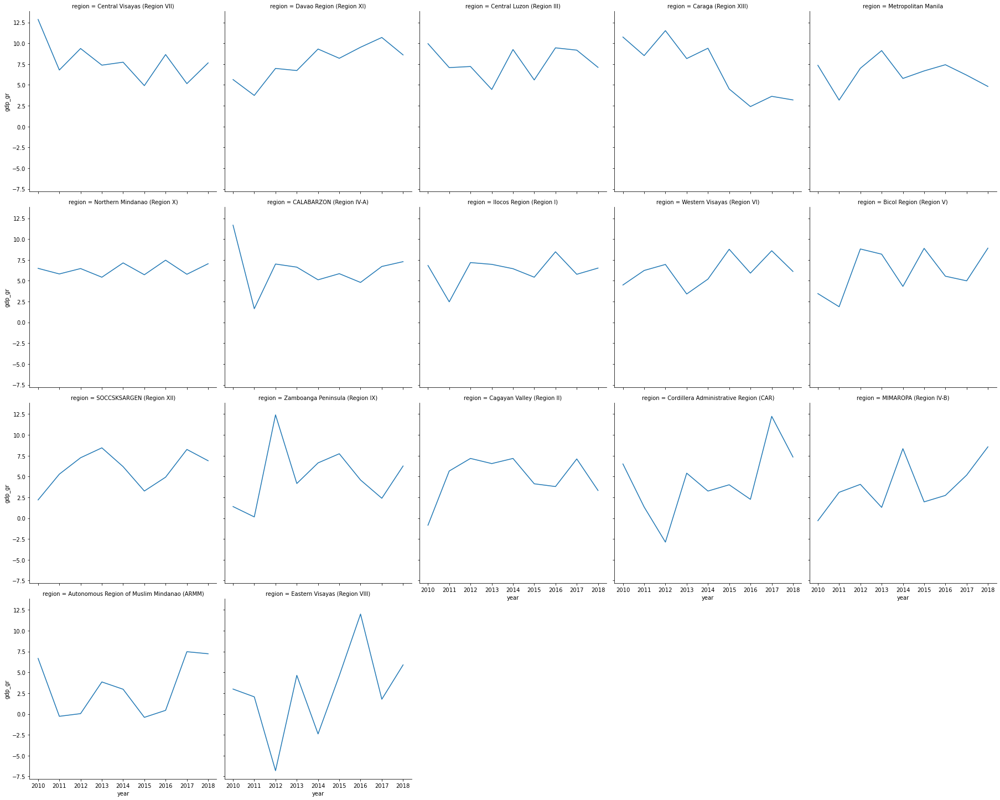

In [48]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_gr.index, col_wrap=5)

In [49]:
#  Average agri GDP growth per region, highest to lowest
top_ave_gdp_p2_agr_gr = df_gdp_p2.groupby(['region']).mean().sort_values(by='gdp_agr_gr', ascending=False)[['zone_code', 'gdp_agr_gr']]
top_ave_gdp_p2_agr_gr

,zone_code,gdp_agr_gr
region,,
Central Luzon (Region III),6,3.513531
Northern Mindanao (Region X),14,2.607905
Bicol Region (Region V),2,2.115180
Ilocos Region (Region I),11,2.096256
CALABARZON (Region IV-A),3,2.088576
Cagayan Valley (Region II),4,1.630254
SOCCSKSARGEN (Region XII),15,1.570676
Central Visayas (Region VII),7,1.512059
Autonomous Region of Muslim Mindanao (ARMM),1,1.480967


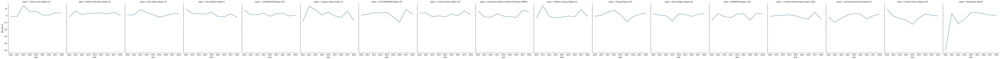

In [50]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_agr_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_agr_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_agr_gr.index)

In [51]:
#  Average industry GDP growth per region, highest to lowest
top_ave_gdp_p2_ind_gr = df_gdp_p2.groupby(['region']).mean().sort_values(by='gdp_ind_gr', ascending=False)[['zone_code', 'gdp_ind_gr']]
top_ave_gdp_p2_ind_gr

,zone_code,gdp_ind_gr
region,,
Western Visayas (Region VI),16,11.533415
Central Luzon (Region III),6,11.327587
Davao Region (Region XI),9,11.276126
Caraga (Region XIII),5,10.116244
Central Visayas (Region VII),7,10.083379
Bicol Region (Region V),2,9.672339
Cagayan Valley (Region II),4,8.847132
SOCCSKSARGEN (Region XII),15,8.227937
Zamboanga Peninsula (Region IX),17,8.063583


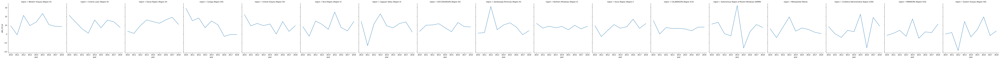

In [52]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_ind_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_ind_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_ind_gr.index)

In [53]:
#  Average service GDP growth per region, highest to lowest
top_ave_gdp_p2_svc_gr = df_gdp_p2.groupby(['region']).mean().sort_values(by='gdp_svc_gr', ascending=False)[['zone_code', 'gdp_svc_gr']]
top_ave_gdp_p2_svc_gr

,zone_code,gdp_svc_gr
region,,
Caraga (Region XIII),5,7.881130
Davao Region (Region XI),9,7.672254
Central Visayas (Region VII),7,7.300418
Northern Mindanao (Region X),14,7.267576
MIMAROPA (Region IV-B),12,7.201434
Ilocos Region (Region I),11,7.184853
SOCCSKSARGEN (Region XII),15,6.935701
Metropolitan Manila,13,6.747271
Zamboanga Peninsula (Region IX),17,6.580397


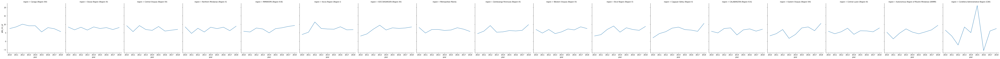

In [54]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_svc_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_svc_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_svc_gr.index)

In [55]:
#  Average non-agri GDP growth per region, highest to lowest
top_ave_gdp_p2_non_agr_gr = df_gdp_p2.groupby(['region']).mean().sort_values(by='gdp_non_agr_gr', ascending=False)[['zone_code', 'gdp_non_agr_gr']]
top_ave_gdp_p2_non_agr_gr

,zone_code,gdp_non_agr_gr
region,,
Davao Region (Region XI),9,9.107523
Caraga (Region XIII),5,8.625399
Central Luzon (Region III),6,8.591744
Central Visayas (Region VII),7,8.322193
Western Visayas (Region VI),16,7.757756
Northern Mindanao (Region X),14,7.609296
SOCCSKSARGEN (Region XII),15,7.521662
Ilocos Region (Region I),11,7.419872
Bicol Region (Region V),2,7.299521


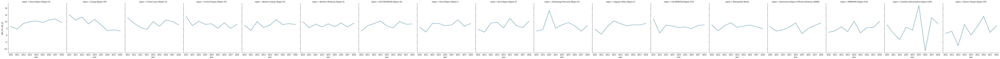

In [56]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdp_p2_non_agr_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdp_non_agr_gr', col='region', kind='line', 
            col_order=top_ave_gdp_p2_non_agr_gr.index)

In [57]:
#  Average per capita GDP growth per region, highest to lowest
top_ave_gdppc_p2_gr = df_gdp_p2.groupby(['region']).mean().sort_values(by='gdppc_gr', ascending=False)[['zone_code', 'gdppc_gr']]
top_ave_gdppc_p2_gr

,zone_code,gdppc_gr
region,,
Central Visayas (Region VII),7,6.024378
Central Luzon (Region III),6,5.921033
Davao Region (Region XI),9,5.634314
Metropolitan Manila,13,5.114420
Ilocos Region (Region I),11,4.777537
Caraga (Region XIII),5,4.759047
Western Visayas (Region VI),16,4.624691
Northern Mindanao (Region X),14,4.573633
CALABARZON (Region IV-A),3,4.083893


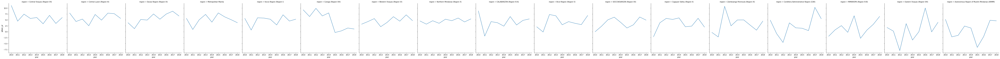

In [58]:
df = df_gdp_p2[df_gdp_p2['region'].isin(top_ave_gdppc_p2_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='gdppc_gr', col='region', kind='line', 
            col_order=top_ave_gdppc_p2_gr.index)

### 2000-08 vs 2009-18

In [59]:
df_gdp.replace([np.inf, -np.inf], np.nan, inplace=True)
df_gdp['period'] = '2000-2008'
df_gdp.loc[df_gdp['year'] >= '2009-01-01', 'period'] = '2009-2018'

<AxesSubplot:xlabel='log_gdp', ylabel='Count'>

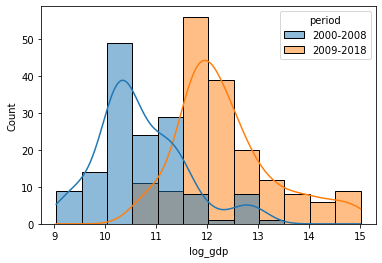

In [60]:
sns.histplot(data=df_gdp, x='log_gdp', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='log_gdp'>

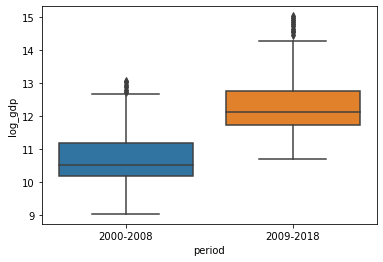

In [61]:
sns.boxplot(data=df_gdp, x='period', y='log_gdp')

<AxesSubplot:xlabel='log_gdp_agr', ylabel='Count'>

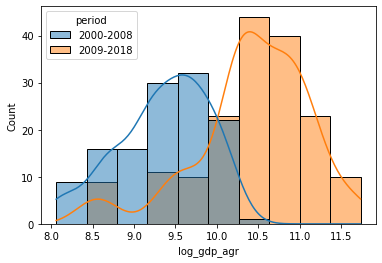

In [62]:
sns.histplot(data=df_gdp, x='log_gdp_agr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='log_gdp_agr'>

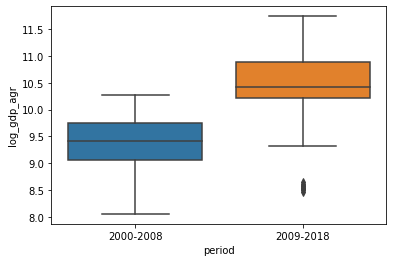

In [63]:
sns.boxplot(data=df_gdp, x='period', y='log_gdp_agr')

<AxesSubplot:xlabel='log_gdp_ind', ylabel='Count'>

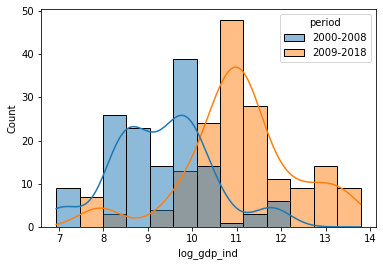

In [64]:
sns.histplot(data=df_gdp, x='log_gdp_ind', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='log_gdp_ind'>

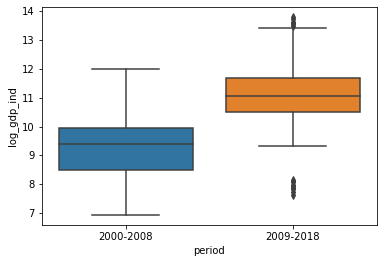

In [65]:
sns.boxplot(data=df_gdp, x='period', y='log_gdp_ind')

<AxesSubplot:xlabel='log_gdp_svc', ylabel='Count'>

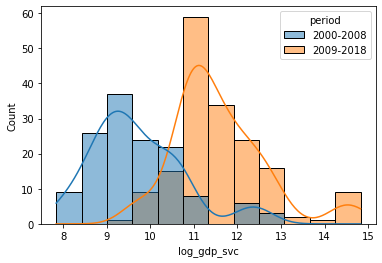

In [66]:
sns.histplot(data=df_gdp, x='log_gdp_svc', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='log_gdp_svc'>

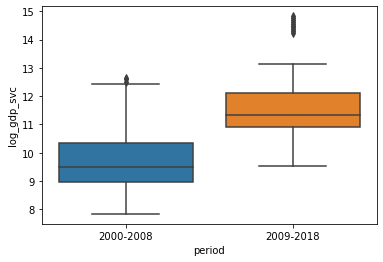

In [67]:
sns.boxplot(data=df_gdp, x='period', y='log_gdp_svc')

<AxesSubplot:xlabel='log_gdp_non_agr', ylabel='Count'>

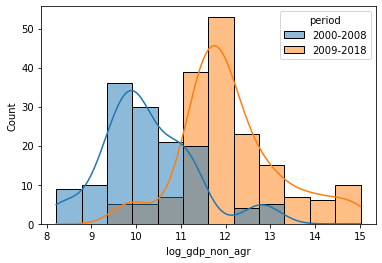

In [68]:
sns.histplot(data=df_gdp, x='log_gdp_non_agr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='log_gdp_non_agr'>

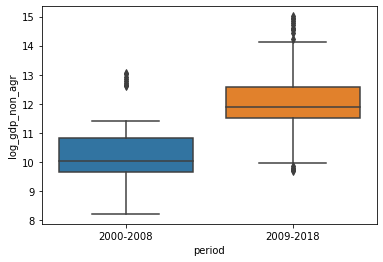

In [69]:
sns.boxplot(data=df_gdp, x='period', y='log_gdp_non_agr')

<AxesSubplot:xlabel='log_gdppc', ylabel='Count'>

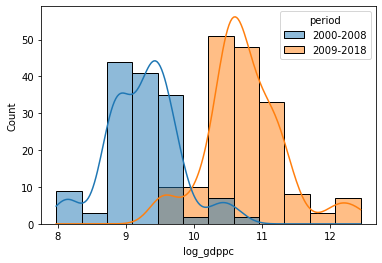

In [70]:
sns.histplot(data=df_gdp, x='log_gdppc', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='log_gdppc'>

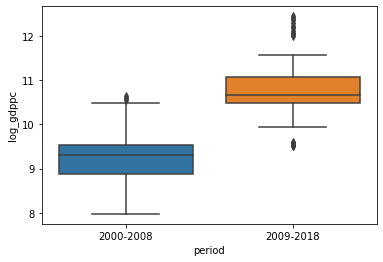

In [71]:
sns.boxplot(data=df_gdp, x='period', y='log_gdppc')

<AxesSubplot:xlabel='gdp_gr', ylabel='Count'>

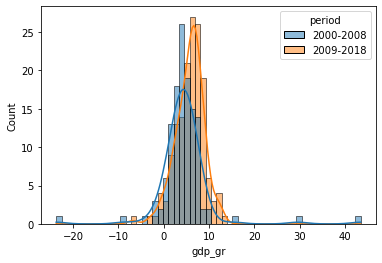

In [72]:
df = df_gdp[df_gdp['year'] != '2009-01-01']
sns.histplot(data=df, x='gdp_gr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='gdp_gr'>

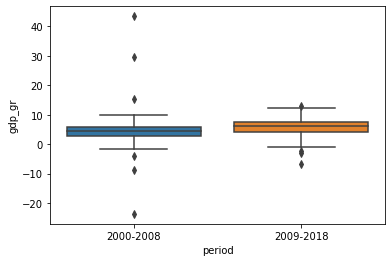

In [73]:
sns.boxplot(data=df, x='period', y='gdp_gr')

<AxesSubplot:xlabel='gdp_agr_gr', ylabel='Count'>

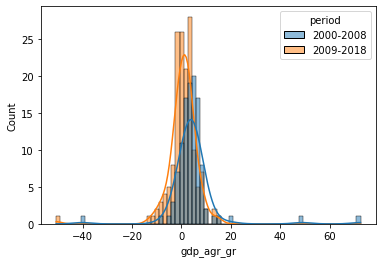

In [74]:
sns.histplot(data=df, x='gdp_agr_gr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='gdp_agr_gr'>

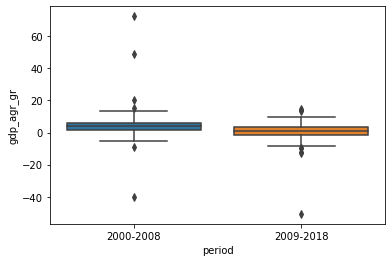

In [75]:
sns.boxplot(data=df, x='period', y='gdp_agr_gr')

<AxesSubplot:xlabel='gdp_ind_gr', ylabel='Count'>

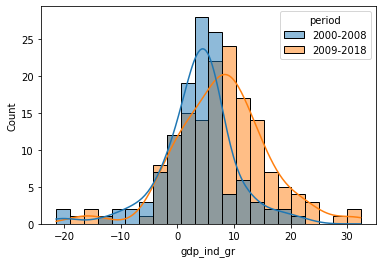

In [76]:
sns.histplot(data=df, x='gdp_ind_gr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='gdp_ind_gr'>

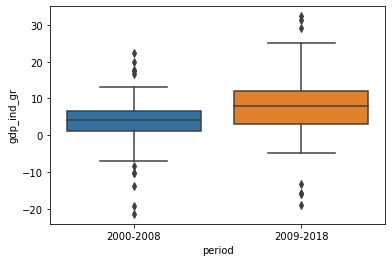

In [77]:
sns.boxplot(data=df, x='period', y='gdp_ind_gr')

<AxesSubplot:xlabel='gdp_svc_gr', ylabel='Count'>

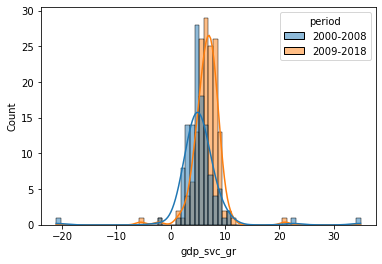

In [78]:
sns.histplot(data=df, x='gdp_svc_gr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='gdp_svc_gr'>

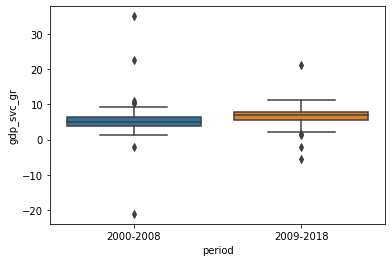

In [79]:
sns.boxplot(data=df, x='period', y='gdp_svc_gr')

<AxesSubplot:xlabel='gdp_non_agr_gr', ylabel='Count'>

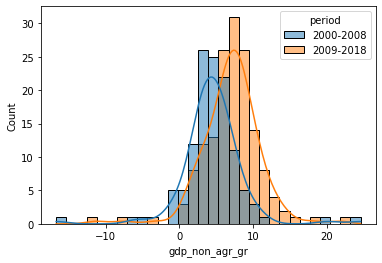

In [80]:
sns.histplot(data=df, x='gdp_non_agr_gr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='gdp_non_agr_gr'>

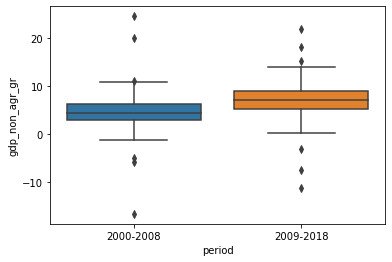

In [81]:
sns.boxplot(data=df, x='period', y='gdp_non_agr_gr')

<AxesSubplot:xlabel='gdppc_gr', ylabel='Count'>

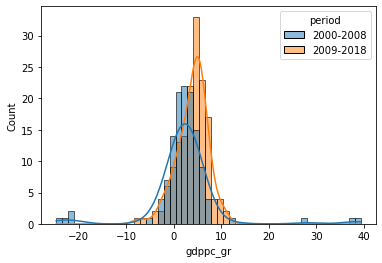

In [82]:
sns.histplot(data=df, x='gdppc_gr', hue='period', kde=True)

<AxesSubplot:xlabel='period', ylabel='gdppc_gr'>

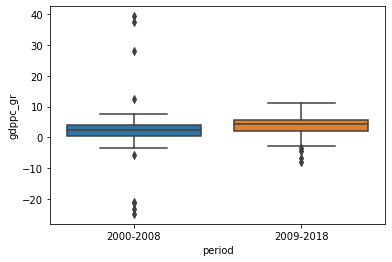

In [83]:
sns.boxplot(data=df, x='period', y='gdppc_gr')

## Nighttime Lights (NTL)

In [317]:
df_ntl = pd.read_csv(path + "data/scratch/data.csv", index_col=False,
                     usecols=['YEAR', 'REGION', 'ZONE_CODE', 'LC_AREA', 'NTL_COUNT', 'NTL_SUM'], 
                     parse_dates=['YEAR'])
df_ntl.columns = [i.lower() for i in df_ntl.columns]

# # Normalize using region's area
# df_ntl.loc[:, 'ntl_count'] = df_ntl.loc[:, 'ntl_count'] / df_ntl.loc[:, 'lc_area'] * 100
# df_ntl.loc[:, 'ntl_sum'] = df_ntl.loc[:, 'ntl_sum'] / df_ntl.loc[:, 'lc_area'] * 100

In [318]:
df_ntl = df_ntl.assign(log_ntl_sum = lambda x: np.log(x.ntl_sum))

In [319]:
ntl_growth = pd.DataFrame(df_ntl.set_index(['region', 'year']).groupby('zone_code').pct_change() * 100).reset_index()

In [320]:
df_ntl = df_ntl.set_index(['region', 'year']).join(ntl_growth.set_index(['region', 'year']), rsuffix='_gr').reset_index()

In [321]:
df_ntl.drop(columns=['ntl_count_gr', 'log_ntl_sum_gr'], inplace=True)

### Regional NTL levels

#### Full sample: 2000-2018

In [322]:
#  19-year average NTL per region, highest to lowest
top_ave_ntl = df_ntl.groupby(['region']).mean().sort_values(by='log_ntl_sum', ascending=False)[['zone_code', 'log_ntl_sum']]
top_ave_ntl

,zone_code,log_ntl_sum
region,,
Metropolitan Manila,13.0,10.865002
CALABARZON (Region IV-A),3.0,10.009558
Central Luzon (Region III),6.0,9.539528
Central Visayas (Region VII),7.0,9.079324
Davao Region (Region XI),9.0,8.652765
Western Visayas (Region VI),16.0,8.198079
Northern Mindanao (Region X),14.0,8.166820
SOCCSKSARGEN (Region XII),15.0,7.693008
Cordillera Administrative Region (CAR),8.0,7.484121


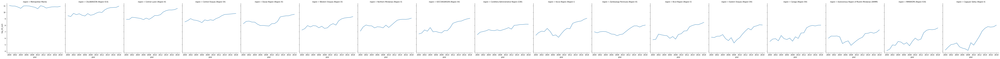

In [90]:
df = df_ntl[df_ntl['region'].isin(top_ave_ntl.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_ntl_sum', col='region', kind='line', 
            col_order=top_ave_ntl.index)

#### Sample: 2000-2008

In [91]:
#  Average NTL per region, highest to lowest
df_ntl_p1 = df_ntl[df_ntl['year'] < '2009-01-01']
top_ave_ntl_p1 = df_ntl_p1.groupby(['region']).mean().sort_values(by='log_ntl_sum', ascending=False)[['zone_code', 'log_ntl_sum']]
top_ave_ntl_p1

,zone_code,log_ntl_sum
region,,
Metropolitan Manila,13,10.918876
CALABARZON (Region IV-A),3,9.603846
Central Luzon (Region III),6,9.038550
Central Visayas (Region VII),7,8.717720
Davao Region (Region XI),9,8.277967
Northern Mindanao (Region X),14,7.716046
Western Visayas (Region VI),16,7.697486
Cordillera Administrative Region (CAR),8,7.091695
SOCCSKSARGEN (Region XII),15,7.029009


#### Sample: 2009-2018

In [92]:
#  Average NTL per region, highest to lowest
df_ntl_p2 = df_ntl[df_ntl['year'] >= '2009-01-01']
top_ave_ntl_p2 = df_ntl_p2.groupby(['region']).mean().sort_values(by='log_ntl_sum', ascending=False)[['zone_code', 'log_ntl_sum']]
top_ave_ntl_p2

,zone_code,log_ntl_sum
region,,
Metropolitan Manila,13.0,10.816515
CALABARZON (Region IV-A),3.0,10.374698
Central Luzon (Region III),6.0,9.990408
Central Visayas (Region VII),7.0,9.404769
Davao Region (Region XI),9.0,8.990082
Western Visayas (Region VI),16.0,8.648614
Northern Mindanao (Region X),14.0,8.572516
SOCCSKSARGEN (Region XII),15.0,8.290608
Ilocos Region (Region I),11.0,8.094771


### Regional NTL growth

#### Full sample: 2000-2018

In [93]:
#  Average NTL growth per region, highest to lowest
top_ave_ntl_gr = df_ntl.groupby(['region']).mean().sort_values(by='ntl_sum_gr', ascending=False)[['zone_code', 'ntl_sum_gr']]
top_ave_ntl_gr

,zone_code,ntl_sum_gr
region,,
Cagayan Valley (Region II),4.0,36.826769
MIMAROPA (Region IV-B),12.0,30.547518
Caraga (Region XIII),5.0,25.233898
Ilocos Region (Region I),11.0,22.955616
Bicol Region (Region V),2.0,22.473170
SOCCSKSARGEN (Region XII),15.0,19.321061
Eastern Visayas (Region VIII),10.0,18.456302
Western Visayas (Region VI),16.0,16.024657
Northern Mindanao (Region X),14.0,15.472099


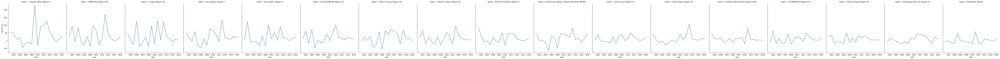

In [94]:
df = df_ntl[df_ntl['region'].isin(top_ave_ntl_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='ntl_sum_gr', col='region', kind='line', 
            col_order=top_ave_ntl_gr.index)

#### Sample: 2000-2008

In [95]:
#  Average NTL growth per region, highest to lowest
top_ave_ntl_gr_p1 = df_ntl_p1.groupby(['region']).mean().sort_values(by='ntl_sum_gr', ascending=False)[['zone_code', 'ntl_sum_gr']]
top_ave_ntl_gr_p1

,zone_code,ntl_sum_gr
region,,
MIMAROPA (Region IV-B),12,18.095037
Northern Mindanao (Region X),14,11.049252
Caraga (Region XIII),5,10.323761
Cordillera Administrative Region (CAR),8,9.177118
Bicol Region (Region V),2,8.824060
SOCCSKSARGEN (Region XII),15,8.524696
Western Visayas (Region VI),16,7.003570
Central Visayas (Region VII),7,5.095948
CALABARZON (Region IV-A),3,4.779910


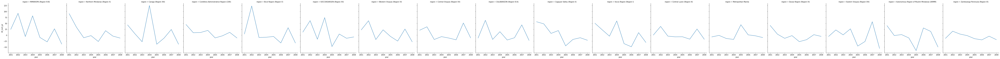

In [96]:
df = df_ntl_p1[df_ntl_p1['region'].isin(top_ave_ntl_gr_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='ntl_sum_gr', col='region', kind='line', 
            col_order=top_ave_ntl_gr_p1.index)

#### Sample: 2009-2018

In [97]:
#  Average NTL growth per region, highest to lowest
df_ntl_p2 = df_ntl[df_ntl['year'] >= '2010-01-01']
top_ave_ntl_gr_p2 = df_ntl_p2.groupby(['region']).mean().sort_values(by='ntl_sum_gr', ascending=False)[['zone_code', 'ntl_sum_gr']]
top_ave_ntl_gr_p2

,zone_code,ntl_sum_gr
region,,
Cagayan Valley (Region II),4.0,44.299364
Ilocos Region (Region I),11.0,34.692383
MIMAROPA (Region IV-B),12.0,34.341430
Eastern Visayas (Region VIII),10.0,32.621944
Caraga (Region XIII),5.0,30.584060
Autonomous Region of Muslim Mindanao (ARMM),1.0,27.447976
SOCCSKSARGEN (Region XII),15.0,26.396334
Bicol Region (Region V),2.0,25.536967
Davao Region (Region XI),9.0,25.326821


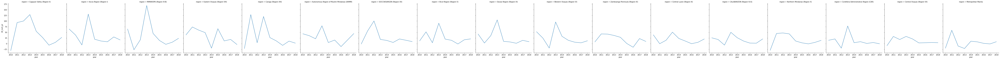

In [98]:
df = df_ntl_p2[df_ntl_p2['region'].isin(top_ave_ntl_gr_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='ntl_sum_gr', col='region', kind='line', 
            col_order=top_ave_ntl_gr_p2.index)

### Unlit Pixels

In [99]:
df_unlit = pd.read_csv(path + "data/scratch/NTL_unlit_region_2000-2018.csv", index_col=False,
                       usecols=['YEAR', 'REGION', 'ZONE_CODE', 'COUNT'], parse_dates=['YEAR'])
df_unlit.columns = [i.lower() for i in df_unlit.columns]
df_unlit = df_ntl.set_index(['region', 'year']).join(df_unlit.set_index(['region', 'year']), rsuffix='_r').reset_index()
df_unlit = df_unlit[['region', 'year', 'zone_code', 'ntl_count', 'count']]
df_unlit.columns = ['region', 'year', 'zone_code', 'total_count', 'unlit_count']
df_unlit = df_unlit.assign(unlit_share = lambda x: 100 * (x.unlit_count / x.total_count))
df_unlit = df_unlit.set_index(['zone_code']).groupby(by='region').mean().reset_index()
# df_unlit.to_excel('region-unlit-share.xlsx', index=False)

In [100]:
df_unlit[['region', 'unlit_share']].sort_values(by='unlit_share', ascending=False)

,region,unlit_share
11,MIMAROPA (Region IV-B),99.805936
3,Cagayan Valley (Region II),99.690300
0,Autonomous Region of Muslim Mindanao (ARMM),99.603114
4,Caraga (Region XIII),99.535494
9,Eastern Visayas (Region VIII),99.534322
7,Cordillera Administrative Region (CAR),99.470030
16,Zamboanga Peninsula (Region IX),99.320011
1,Bicol Region (Region V),99.286382
14,SOCCSKSARGEN (Region XII),98.979824
13,Northern Mindanao (Region X),98.604951


### Average Light Intensities

In [101]:
df_ntl_intensity = pd.read_csv(path + "data/scratch/data.csv", index_col=False,
                               usecols=['YEAR', 'REGION', 'ZONE_CODE', 'NTL_MEAN'], 
                               parse_dates=['YEAR'])
df_ntl_intensity.columns = [i.lower() for i in df_ntl_intensity.columns]
df_ntl_intensity = df_ntl_intensity.set_index(['zone_code']).groupby('region').mean().reset_index()
# df_ntl_intensity.to_csv('region-ntl-intensity.csv', index=False)

In [103]:
df_ntl_intensity.sort_values(by='ntl_mean', ascending=False)

,region,ntl_mean
12,Metropolitan Manila,22.745020
2,CALABARZON (Region IV-A),0.366114
5,Central Luzon (Region III),0.187996
6,Central Visayas (Region VII),0.168813
8,Davao Region (Region XI),0.090711
13,Northern Mindanao (Region X),0.058828
15,Western Visayas (Region VI),0.055205
10,Ilocos Region (Region I),0.050684
14,SOCCSKSARGEN (Region XII),0.041611
7,Cordillera Administrative Region (CAR),0.026083


## Land Cover

In [175]:
df_lc = pd.read_csv(path + "data/scratch/data.csv", index_col=False,
                    usecols=['YEAR', 'REGION', 'ZONE_CODE', 'LC_AREA'] + 
                    ['LC_C' + str(i) for i in [10, 12, 14]], 
                    parse_dates=['YEAR'])
df_lc.columns = [i.lower() for i in df_lc.columns]

# Transform into shares in total area
df_lc.loc[:, 'lc_c10'] = df_lc.loc[:, 'lc_c10'] / df_lc.loc[:, 'lc_area'] * 100
df_lc.loc[:, 'lc_c12'] = df_lc.loc[:, 'lc_c12'] / df_lc.loc[:, 'lc_area'] * 100
df_lc.loc[:, 'lc_c14'] = df_lc.loc[:, 'lc_c14'] / df_lc.loc[:, 'lc_area'] * 100

In [177]:
df_lc = df_lc.assign(lc_c10_c12 = lambda x: x.lc_c10 + x.lc_c12,
                     lc_c12_c14 = lambda x: x.lc_c12 + x.lc_c14,
                     lc_c10_c12_c14 = lambda x: x.lc_c10 + x.lc_c12 + x.lc_c14,
                     log_lc_c10 = lambda x: np.log(x.lc_c10), 
                     log_lc_c12 = lambda x: np.log(x.lc_c12),
                     log_lc_c14 = lambda x: np.log(x.lc_c14),
                     log_lc_c10_c12 = lambda x: np.log(x.lc_c10_c12),
                     log_lc_c12_c14 = lambda x: np.log(x.lc_c12_c14),
                     log_lc_c10_c12_c14 = lambda x: np.log(x.lc_c10_c12_c14))

C:\Users\Jesson Pagaduan\Anaconda3\lib\site-packages\pandas\core\series.py:726: RuntimeWarning:

divide by zero encountered in log



In [178]:
lc_growth = pd.DataFrame(df_lc.set_index(['region', 'year']).groupby('zone_code').pct_change() * 100).reset_index()

In [179]:
df_lc = df_lc.set_index(['region', 'year']).join(lc_growth.set_index(['region', 'year']), rsuffix='_gr').reset_index()

In [180]:
df_lc.drop(columns=['log_lc_c10_gr', 'log_lc_c12_gr', 'log_lc_c14_gr', 'log_lc_c10_c12_gr',
                    'log_lc_c12_c14_gr', 'log_lc_c10_c12_c14_gr'], 
           inplace=True)

### Land cover area

#### Full sample: 2001-2018

In [181]:
#  19-year average grasslands area per region, highest to lowest
top_ave_lc_c10 = df_lc.groupby(['region']).mean().sort_values(by='log_lc_c10', ascending=False)[['zone_code', 'log_lc_c10']]
top_ave_lc_c10

,zone_code,log_lc_c10
region,,
MIMAROPA (Region IV-B),12,2.228770
Ilocos Region (Region I),11,1.878237
Bicol Region (Region V),2,1.871982
Caraga (Region XIII),5,1.854192
CALABARZON (Region IV-A),3,1.662168
Central Luzon (Region III),6,1.633128
Eastern Visayas (Region VIII),10,1.629108
Cagayan Valley (Region II),4,1.560826
Western Visayas (Region VI),16,1.500412


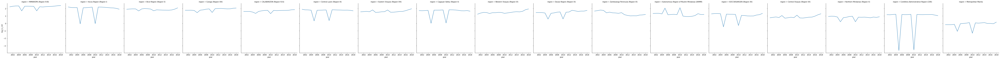

In [182]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c10.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10', col='region', kind='line', 
            col_order=top_ave_lc_c10.index)

In [183]:
#  19-year average croplands area per region, highest to lowest
top_ave_lc_c12 = df_lc.groupby(['region']).mean().sort_values(by='log_lc_c12', ascending=False)[['zone_code', 'log_lc_c12']]
top_ave_lc_c12

,zone_code,log_lc_c12
region,,
Central Luzon (Region III),6,3.040182
Ilocos Region (Region I),11,2.701996
CALABARZON (Region IV-A),3,2.016906
Cagayan Valley (Region II),4,1.942386
Western Visayas (Region VI),16,1.798665
SOCCSKSARGEN (Region XII),15,1.230069
Bicol Region (Region V),2,1.224164
Northern Mindanao (Region X),14,1.188519
Zamboanga Peninsula (Region IX),17,1.153499


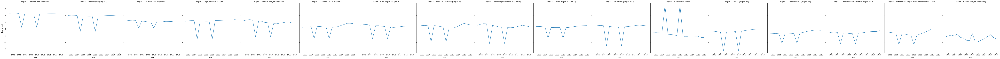

In [184]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c12.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c12', col='region', kind='line', 
            col_order=top_ave_lc_c12.index)

In [185]:
#  19-year average vegetation area per region, highest to lowest
top_ave_lc_c14 = df_lc.groupby(['region']).mean().sort_values(by='log_lc_c14', ascending=False)[['zone_code', 'log_lc_c14']]
top_ave_lc_c14

,zone_code,log_lc_c14
region,,
Autonomous Region of Muslim Mindanao (ARMM),1,2.018679
Cagayan Valley (Region II),4,1.022903
Central Visayas (Region VII),7,0.668834
MIMAROPA (Region IV-B),12,-0.558314
Ilocos Region (Region I),11,-inf
Western Visayas (Region VI),16,-inf
SOCCSKSARGEN (Region XII),15,-inf
Northern Mindanao (Region X),14,-inf
Metropolitan Manila,13,-inf


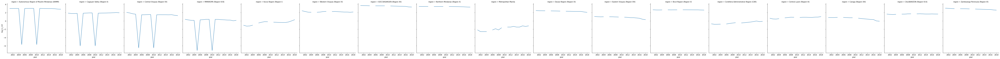

In [186]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c14.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c14', col='region', kind='line', 
            col_order=top_ave_lc_c14.index)

In [187]:
#  19-year average grasslands+croplands area per region, highest to lowest
top_ave_lc_c10_c12 = df_lc.groupby(['region']).mean().sort_values(by='log_lc_c10_c12', ascending=False)[['zone_code', 'log_lc_c10_c12']]
top_ave_lc_c10_c12

,zone_code,log_lc_c10_c12
region,,
Central Luzon (Region III),6,3.262533
Ilocos Region (Region I),11,3.066862
CALABARZON (Region IV-A),3,2.555989
MIMAROPA (Region IV-B),12,2.544082
Cagayan Valley (Region II),4,2.479589
Western Visayas (Region VI),16,2.412053
Bicol Region (Region V),2,2.320078
Caraga (Region XIII),5,2.097161
Zamboanga Peninsula (Region IX),17,2.022620


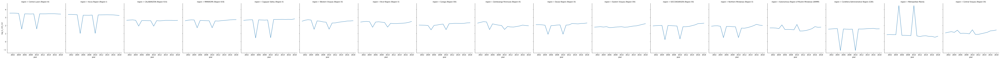

In [188]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c10_c12.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10_c12', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12.index)

In [189]:
#  19-year average croplands+vegetation area per region, highest to lowest
top_ave_lc_c12_c14 = df_lc.groupby(['region']).mean().sort_values(by='log_lc_c12_c14', ascending=False)[['zone_code', 'log_lc_c12_c14']]
top_ave_lc_c12_c14

,zone_code,log_lc_c12_c14
region,,
SOCCSKSARGEN (Region XII),15,3.241239
Central Luzon (Region III),6,3.113455
Northern Mindanao (Region X),14,3.083370
Ilocos Region (Region I),11,2.733322
Zamboanga Peninsula (Region IX),17,2.613826
Autonomous Region of Muslim Mindanao (ARMM),1,2.579990
Bicol Region (Region V),2,2.549566
Western Visayas (Region VI),16,2.492631
CALABARZON (Region IV-A),3,2.452302


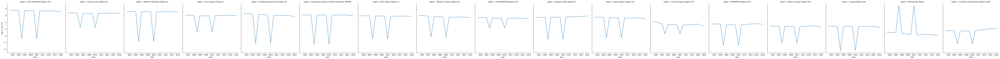

In [190]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c12_c14.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c12_c14', col='region', kind='line', 
            col_order=top_ave_lc_c12_c14.index)

In [191]:
#  19-year average agri area per region, highest to lowest
top_ave_lc_c10_c12_c14 = df_lc.groupby(['region']).mean().sort_values(by='log_lc_c10_c12_c14', ascending=False)[['zone_code', 'log_lc_c10_c12_c14']]
top_ave_lc_c10_c12_c14

,zone_code,log_lc_c10_c12_c14
region,,
SOCCSKSARGEN (Region XII),15,3.391503
Central Luzon (Region III),6,3.322592
Northern Mindanao (Region X),14,3.297540
Ilocos Region (Region I),11,3.088931
Autonomous Region of Muslim Mindanao (ARMM),1,3.084307
Bicol Region (Region V),2,3.071775
Zamboanga Peninsula (Region IX),17,3.054306
Western Visayas (Region VI),16,2.901309
CALABARZON (Region IV-A),3,2.841906


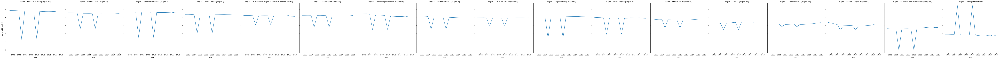

In [192]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c10_c12_c14.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10_c12_c14', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_c14.index)

#### Sample: 2000-2008

In [193]:
df_lc_p1 = df_lc[df_lc['year'] < '2009-01-01']

In [194]:
#  Average grasslands area per region, highest to lowest
top_ave_lc_c10_p1 = df_lc_p1.groupby(['region']).mean().sort_values(by='log_lc_c10', ascending=False)[['zone_code', 'log_lc_c10']]
top_ave_lc_c10_p1

,zone_code,log_lc_c10
region,,
MIMAROPA (Region IV-B),12,2.225632
Bicol Region (Region V),2,1.914016
Ilocos Region (Region I),11,1.858773
Caraga (Region XIII),5,1.747317
Central Luzon (Region III),6,1.621160
CALABARZON (Region IV-A),3,1.590159
Eastern Visayas (Region VIII),10,1.583448
Zamboanga Peninsula (Region IX),17,1.583153
Cagayan Valley (Region II),4,1.533493


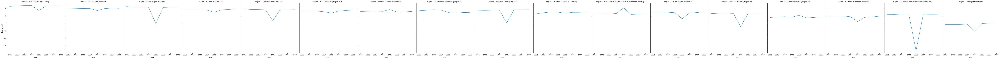

In [195]:
df = df_lc_p1[df_lc_p1['region'].isin(top_ave_lc_c10_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10', col='region', kind='line', 
            col_order=top_ave_lc_c10_p1.index)

In [196]:
#  Average croplands area per region, highest to lowest
top_ave_lc_c12_p1 = df_lc_p1.groupby(['region']).mean().sort_values(by='log_lc_c12', ascending=False)[['zone_code', 'log_lc_c12']]
top_ave_lc_c12_p1

,zone_code,log_lc_c12
region,,
Central Luzon (Region III),6,3.033141
Ilocos Region (Region I),11,2.676343
CALABARZON (Region IV-A),3,2.064474
Western Visayas (Region VI),16,1.925560
Cagayan Valley (Region II),4,1.848873
Bicol Region (Region V),2,1.296874
Zamboanga Peninsula (Region IX),17,1.239076
Northern Mindanao (Region X),14,1.168148
SOCCSKSARGEN (Region XII),15,1.095014


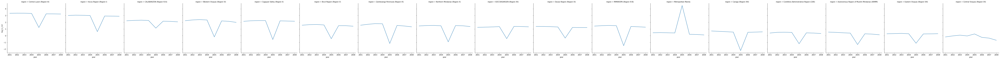

In [197]:
df = df_lc_p1[df_lc_p1['region'].isin(top_ave_lc_c12_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c12', col='region', kind='line', 
            col_order=top_ave_lc_c12_p1.index)

In [198]:
#  Average vegetation area per region, highest to lowest
top_ave_lc_c14_p1 = df_lc_p1.groupby(['region']).mean().sort_values(by='log_lc_c14', ascending=False)[['zone_code', 'log_lc_c14']]
top_ave_lc_c14_p1

,zone_code,log_lc_c14
region,,
Autonomous Region of Muslim Mindanao (ARMM),1,1.923300
Cagayan Valley (Region II),4,0.871439
Central Visayas (Region VII),7,0.671615
MIMAROPA (Region IV-B),12,-0.655763
Ilocos Region (Region I),11,-inf
Western Visayas (Region VI),16,-inf
SOCCSKSARGEN (Region XII),15,-inf
Northern Mindanao (Region X),14,-inf
Metropolitan Manila,13,-inf


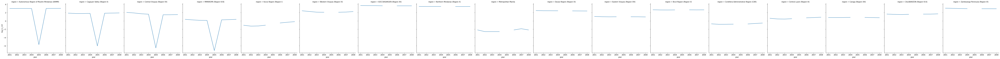

In [199]:
df = df_lc_p1[df_lc_p1['region'].isin(top_ave_lc_c14_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c14', col='region', kind='line', 
            col_order=top_ave_lc_c14_p1.index)

In [200]:
#  19-year average grasslands+croplands area per region, highest to lowest
top_ave_lc_c10_c12_p1 = df_lc_p1.groupby(['region']).mean().sort_values(by='log_lc_c10_c12', ascending=False)[['zone_code', 'log_lc_c10_c12']]
top_ave_lc_c10_c12_p1

,zone_code,log_lc_c10_c12
region,,
Central Luzon (Region III),6,3.254814
Ilocos Region (Region I),11,3.042732
CALABARZON (Region IV-A),3,2.558776
MIMAROPA (Region IV-B),12,2.531514
Western Visayas (Region VI),16,2.464870
Cagayan Valley (Region II),4,2.411646
Bicol Region (Region V),2,2.377647
Zamboanga Peninsula (Region IX),17,2.188913
Caraga (Region XIII),5,1.979158


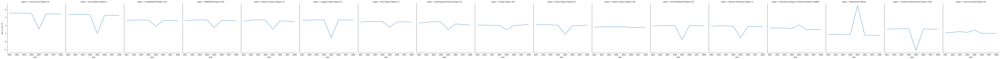

In [201]:
df = df_lc_p1[df_lc_p1['region'].isin(top_ave_lc_c10_c12_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10_c12', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_p1.index)

In [202]:
#  Average croplands+vegetation area per region, highest to lowest
top_ave_lc_c12_c14_p1 = df_lc_p1.groupby(['region']).mean().sort_values(by='log_lc_c12_c14', ascending=False)[['zone_code', 'log_lc_c12_c14']]
top_ave_lc_c12_c14_p1

,zone_code,log_lc_c12_c14
region,,
SOCCSKSARGEN (Region XII),15,3.234078
Central Luzon (Region III),6,3.094946
Northern Mindanao (Region X),14,3.043848
Ilocos Region (Region I),11,2.698936
Zamboanga Peninsula (Region IX),17,2.660016
Autonomous Region of Muslim Mindanao (ARMM),1,2.531455
Western Visayas (Region VI),16,2.526674
Bicol Region (Region V),2,2.524127
CALABARZON (Region IV-A),3,2.457717


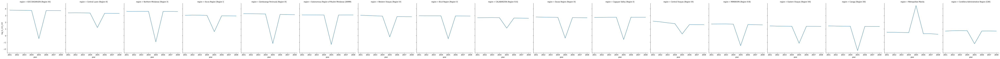

In [203]:
df = df_lc_p1[df_lc_p1['region'].isin(top_ave_lc_c12_c14_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c12_c14', col='region', kind='line', 
            col_order=top_ave_lc_c12_c14_p1.index)

In [204]:
#  Average agri area per region, highest to lowest
top_ave_lc_c10_c12_c14_p1 = df_lc_p1.groupby(['region']).mean().sort_values(by='log_lc_c10_c12_c14', ascending=False)[['zone_code', 'log_lc_c10_c12_c14']]
top_ave_lc_c10_c12_c14_p1

,zone_code,log_lc_c10_c12_c14
region,,
SOCCSKSARGEN (Region XII),15,3.389856
Central Luzon (Region III),6,3.305510
Northern Mindanao (Region X),14,3.277315
Zamboanga Peninsula (Region IX),17,3.154306
Autonomous Region of Muslim Mindanao (ARMM),1,3.088385
Bicol Region (Region V),2,3.078237
Ilocos Region (Region I),11,3.058473
Western Visayas (Region VI),16,2.919629
CALABARZON (Region IV-A),3,2.828489


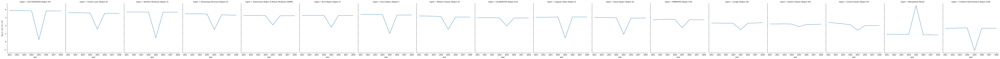

In [205]:
df = df_lc_p1[df_lc_p1['region'].isin(top_ave_lc_c10_c12_c14_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10_c12_c14', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_c14_p1.index)

#### Sample: 2009-2018

In [206]:
df_lc_p2 = df_lc[df_lc['year'] >= '2009-01-01']

In [207]:
#  Average grasslands area per region, highest to lowest
top_ave_lc_c10_p2 = df_lc_p2.groupby(['region']).mean().sort_values(by='log_lc_c10', ascending=False)[['zone_code', 'log_lc_c10']]
top_ave_lc_c10_p2

,zone_code,log_lc_c10
region,,
MIMAROPA (Region IV-B),12,2.231280
Caraga (Region XIII),5,1.939691
Ilocos Region (Region I),11,1.893809
Bicol Region (Region V),2,1.838355
CALABARZON (Region IV-A),3,1.719776
Eastern Visayas (Region VIII),10,1.665636
Central Luzon (Region III),6,1.642701
Cagayan Valley (Region II),4,1.582693
Western Visayas (Region VI),16,1.575239


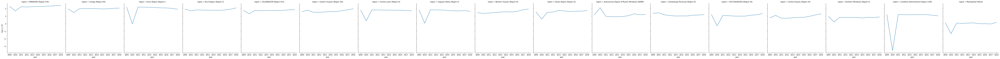

In [208]:
df = df_lc_p2[df_lc_p2['region'].isin(top_ave_lc_c10_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10', col='region', kind='line', 
            col_order=top_ave_lc_c10_p2.index)

In [209]:
#  Average croplands area per region, highest to lowest
top_ave_lc_c12_p2 = df_lc_p2.groupby(['region']).mean().sort_values(by='log_lc_c12', ascending=False)[['zone_code', 'log_lc_c12']]
top_ave_lc_c12_p2

,zone_code,log_lc_c12
region,,
Central Luzon (Region III),6,3.045815
Ilocos Region (Region I),11,2.722518
Cagayan Valley (Region II),4,2.017196
CALABARZON (Region IV-A),3,1.978852
Western Visayas (Region VI),16,1.697148
SOCCSKSARGEN (Region XII),15,1.338112
Northern Mindanao (Region X),14,1.204816
Davao Region (Region XI),9,1.182890
Bicol Region (Region V),2,1.165996


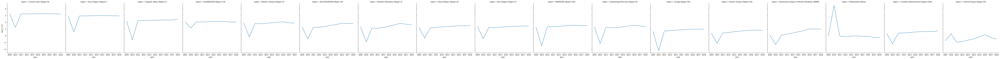

In [210]:
df = df_lc_p2[df_lc_p2['region'].isin(top_ave_lc_c12_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c12', col='region', kind='line', 
            col_order=top_ave_lc_c12_p2.index)

In [211]:
#  Average vegetation area per region, highest to lowest
top_ave_lc_c14_p2 = df_lc_p2.groupby(['region']).mean().sort_values(by='log_lc_c14', ascending=False)[['zone_code', 'log_lc_c14']]
top_ave_lc_c14_p2

,zone_code,log_lc_c14
region,,
Autonomous Region of Muslim Mindanao (ARMM),1,2.094982
Cagayan Valley (Region II),4,1.144073
Central Visayas (Region VII),7,0.666610
MIMAROPA (Region IV-B),12,-0.480355
Ilocos Region (Region I),11,-inf
Western Visayas (Region VI),16,-inf
SOCCSKSARGEN (Region XII),15,-inf
Northern Mindanao (Region X),14,-inf
Metropolitan Manila,13,-inf


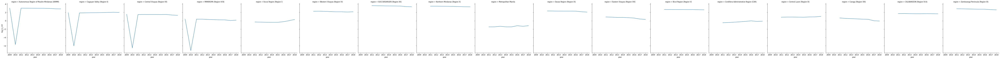

In [212]:
df = df_lc_p2[df_lc_p2['region'].isin(top_ave_lc_c14_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c14', col='region', kind='line', 
            col_order=top_ave_lc_c14_p2.index)

In [213]:
#  Average grasslands+croplands area per region, highest to lowest
top_ave_lc_c10_c12_p2 = df_lc_p2.groupby(['region']).mean().sort_values(by='log_lc_c10_c12', ascending=False)[['zone_code', 'log_lc_c10_c12']]
top_ave_lc_c10_c12_p2

,zone_code,log_lc_c10_c12
region,,
Central Luzon (Region III),6,3.268708
Ilocos Region (Region I),11,3.086166
MIMAROPA (Region IV-B),12,2.554137
CALABARZON (Region IV-A),3,2.553759
Cagayan Valley (Region II),4,2.533944
Western Visayas (Region VI),16,2.369799
Bicol Region (Region V),2,2.274023
Caraga (Region XIII),5,2.191564
Davao Region (Region XI),9,2.068593


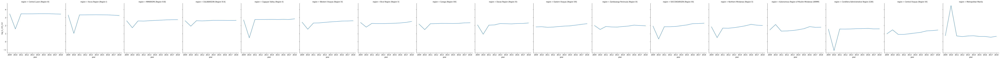

In [214]:
df = df_lc_p2[df_lc_p2['region'].isin(top_ave_lc_c10_c12_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10_c12', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_p2.index)

In [215]:
#  19-year average croplands+vegetation area per region, highest to lowest
top_ave_lc_c12_c14_p2 = df_lc_p2.groupby(['region']).mean().sort_values(by='log_lc_c12_c14', ascending=False)[['zone_code', 'log_lc_c12_c14']]
top_ave_lc_c12_c14_p2

,zone_code,log_lc_c12_c14
region,,
SOCCSKSARGEN (Region XII),15,3.246967
Central Luzon (Region III),6,3.128263
Northern Mindanao (Region X),14,3.114987
Ilocos Region (Region I),11,2.760832
Autonomous Region of Muslim Mindanao (ARMM),1,2.618818
Zamboanga Peninsula (Region IX),17,2.576873
Bicol Region (Region V),2,2.569917
Cagayan Valley (Region II),4,2.492558
Western Visayas (Region VI),16,2.465397


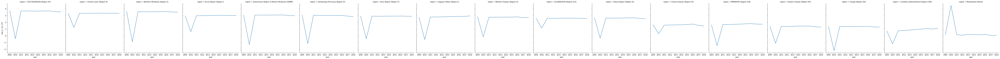

In [216]:
df = df_lc_p2[df_lc_p2['region'].isin(top_ave_lc_c12_c14_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c12_c14', col='region', kind='line', 
            col_order=top_ave_lc_c12_c14_p2.index)

In [217]:
# Average agri area per region, highest to lowest
top_ave_lc_c10_c12_c14_p2 = df_lc_p2.groupby(['region']).mean().sort_values(by='log_lc_c10_c12_c14', ascending=False)[['zone_code', 'log_lc_c10_c12_c14']]
top_ave_lc_c10_c12_c14_p2

,zone_code,log_lc_c10_c12_c14
region,,
SOCCSKSARGEN (Region XII),15,3.392820
Central Luzon (Region III),6,3.336258
Northern Mindanao (Region X),14,3.313719
Ilocos Region (Region I),11,3.113297
Autonomous Region of Muslim Mindanao (ARMM),1,3.081045
Bicol Region (Region V),2,3.066605
Zamboanga Peninsula (Region IX),17,2.974306
Western Visayas (Region VI),16,2.886654
Cagayan Valley (Region II),4,2.862245


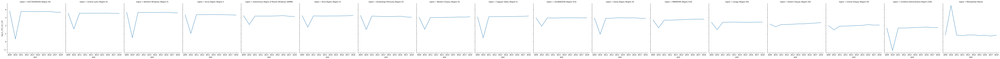

In [218]:
df = df_lc_p2[df_lc_p2['region'].isin(top_ave_lc_c10_c12_c14_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_lc_c10_c12_c14', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_c14_p2.index)

### Land cover area growth

In [219]:
#  19-year average grasslands area growth per region, highest to lowest
top_ave_lc_c10_gr = df_lc.groupby(['region']).mean().sort_values(by='lc_c10_gr', ascending=False)[['zone_code', 'lc_c10_gr']]
top_ave_lc_c10_gr

,zone_code,lc_c10_gr
region,,
Cordillera Administrative Region (CAR),8,1410.129872
Ilocos Region (Region I),11,81.138997
Cagayan Valley (Region II),4,46.507727
SOCCSKSARGEN (Region XII),15,35.601720
Central Luzon (Region III),6,27.710026
Metropolitan Manila,13,22.021052
Davao Region (Region XI),9,10.944603
Autonomous Region of Muslim Mindanao (ARMM),1,9.624963
MIMAROPA (Region IV-B),12,5.477401


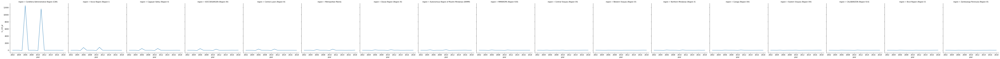

In [220]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c10_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='lc_c10_gr', col='region', kind='line', 
            col_order=top_ave_lc_c10_gr.index)

In [221]:
#  19-year average croplands area growth per region, highest to lowest
top_ave_lc_c12_gr = df_lc.groupby(['region']).mean().sort_values(by='lc_c12_gr', ascending=False)[['zone_code', 'lc_c12_gr']]
top_ave_lc_c12_gr

,zone_code,lc_c12_gr
region,,
Metropolitan Manila,13,847.031394
MIMAROPA (Region IV-B),12,178.658979
Caraga (Region XIII),5,176.083507
Cagayan Valley (Region II),4,173.258038
Zamboanga Peninsula (Region IX),17,127.279082
Ilocos Region (Region I),11,98.178531
Northern Mindanao (Region X),14,90.846893
Western Visayas (Region VI),16,83.407316
Central Luzon (Region III),6,66.896859


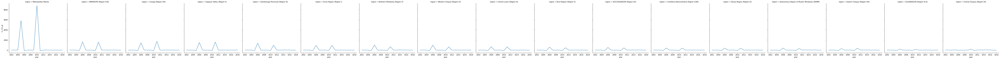

In [222]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c12_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='lc_c12_gr', col='region', kind='line', 
            col_order=top_ave_lc_c12_gr.index)

In [223]:
#  19-year average vegetation area growth per region, highest to lowest
top_ave_lc_c14_gr = df_lc.groupby(['region']).mean().sort_values(by='lc_c14_gr', ascending=False)[['zone_code', 'lc_c14_gr']]
top_ave_lc_c14_gr

,zone_code,lc_c14_gr
region,,
Davao Region (Region XI),9,inf
Bicol Region (Region V),2,inf
Western Visayas (Region VI),16,inf
SOCCSKSARGEN (Region XII),15,inf
Northern Mindanao (Region X),14,inf
Metropolitan Manila,13,inf
Ilocos Region (Region I),11,inf
Eastern Visayas (Region VIII),10,inf
Zamboanga Peninsula (Region IX),17,inf


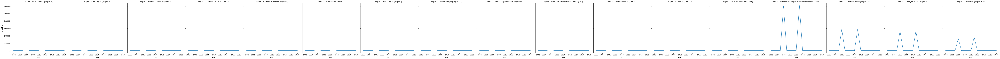

In [224]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c14_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='lc_c14_gr', col='region', kind='line', 
            col_order=top_ave_lc_c14_gr.index)

In [225]:
#  19-year average grasslands+croplands area per region, highest to lowest
top_ave_lc_c10_c12_gr = df_lc.groupby(['region']).mean().sort_values(by='lc_c10_c12_gr', ascending=False)[['zone_code', 'lc_c10_c12_gr']]
top_ave_lc_c10_c12_gr

,zone_code,lc_c10_c12_gr
region,,
Metropolitan Manila,13,445.202840
Cordillera Administrative Region (CAR),8,149.914388
Ilocos Region (Region I),11,92.382303
Cagayan Valley (Region II),4,91.402394
Central Luzon (Region III),6,55.228206
SOCCSKSARGEN (Region XII),15,42.530104
Northern Mindanao (Region X),14,24.033745
Davao Region (Region XI),9,17.372920
Western Visayas (Region VI),16,11.932119


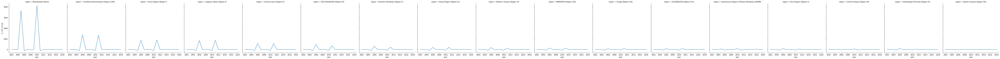

In [226]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c10_c12_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='lc_c10_c12_gr', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_gr.index)

In [227]:
#  19-year average croplands+vegetation area per region, highest to lowest
top_ave_lc_c12_c14_gr = df_lc.groupby(['region']).mean().sort_values(by='lc_c12_c14_gr', ascending=False)[['zone_code', 'lc_c12_c14_gr']]
top_ave_lc_c12_c14_gr

,zone_code,lc_c12_c14_gr
region,,
Northern Mindanao (Region X),14,1037.435769
Autonomous Region of Muslim Mindanao (ARMM),1,916.328566
Zamboanga Peninsula (Region IX),17,812.418021
Metropolitan Manila,13,746.581338
SOCCSKSARGEN (Region XII),15,727.330671
Caraga (Region XIII),5,405.014142
Bicol Region (Region V),2,321.201283
Cagayan Valley (Region II),4,306.324026
MIMAROPA (Region IV-B),12,248.732580


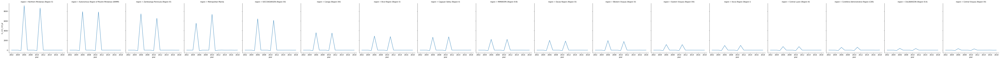

In [228]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c12_c14_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='lc_c12_c14_gr', col='region', kind='line', 
            col_order=top_ave_lc_c12_c14_gr.index)

In [229]:
#  19-year average agri area per region, highest to lowest
top_ave_lc_c10_c12_c14_gr = df_lc.groupby(['region']).mean().sort_values(by='lc_c10_c12_c14_gr', ascending=False)[['zone_code', 'lc_c10_c12_c14_gr']]
top_ave_lc_c10_c12_c14_gr

,zone_code,lc_c10_c12_c14_gr
region,,
Metropolitan Manila,13,417.987801
SOCCSKSARGEN (Region XII),15,367.547742
Northern Mindanao (Region X),14,250.004422
Cordillera Administrative Region (CAR),8,170.046709
Cagayan Valley (Region II),4,138.248401
Ilocos Region (Region I),11,95.420916
Davao Region (Region XI),9,63.970873
Central Luzon (Region III),6,60.700494
Zamboanga Peninsula (Region IX),17,45.041988


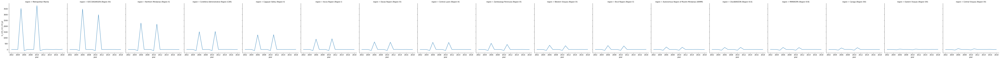

In [230]:
df = df_lc[df_lc['region'].isin(top_ave_lc_c10_c12_c14_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='lc_c10_c12_c14_gr', col='region', kind='line', 
            col_order=top_ave_lc_c10_c12_c14_gr.index)

### Croplands per region

In [231]:
df_croplands = pd.read_csv(path + "data/scratch/data.csv", index_col=False,
                           usecols=['YEAR', 'REGION', 'ZONE_CODE', 'LC_AREA', 'LC_C12', 'LC_C14'], 
                           parse_dates=['YEAR'])
df_croplands.columns = [i.lower() for i in df_croplands.columns]
df_croplands = df_croplands.assign(lc_c12_c14 = lambda x: x.lc_c12 + x.lc_c14,
                                   lc_c12_share = lambda x: 100 * (x.lc_c12 / x.lc_area),
                                   lc_c12_c14_share = lambda x: 100 * (x.lc_c12_c14 / x.lc_area))
df_croplands = df_croplands.set_index(['zone_code']).groupby(by='region').mean()[['lc_c12_share', 'lc_c12_c14_share']].reset_index()
df_croplands.to_csv('region-croplands.csv', index=False)

In [232]:
df_croplands

,region,lc_c12_share,lc_c12_c14_share
0,Autonomous Region of Muslim Mindanao (ARMM),1.529892,19.117602
1,Bicol Region (Region V),3.830204,16.638081
2,CALABARZON (Region IV-A),7.833428,12.527384
3,Cagayan Valley (Region II),8.586038,14.558086
4,Caraga (Region XIII),1.880631,3.541454
5,Central Luzon (Region III),23.728420,25.723162
6,Central Visayas (Region VII),0.790375,5.123450
7,Cordillera Administrative Region (CAR),1.481141,2.065184
8,Davao Region (Region XI),3.439320,12.813176
9,Eastern Visayas (Region VIII),1.512545,3.620533


## Net primary production (NPP)

In [287]:
df_npp = pd.read_csv(path + "data/scratch/npp_extracted_regional_2000-2018.csv", index_col=False,
                    usecols=['YEAR', 'REGION', 'ZONE_CODE', 'SUM'], parse_dates=['YEAR'])
df_npp.columns = [i.lower() for i in df_npp.columns]

# Merge with df_lc to include region's area
df_npp = df_npp.set_index('region').join(df_lc[['region', 'lc_area']].groupby('region').first()).reset_index()
df_npp.columns = ['region', 'year', 'zone_code', 'npp_sum', 'region_area']

# Normalize NPP using region area
df_npp = df_npp.assign(npp_sum_area = lambda x: 100* (x.npp_sum / x.region_area),
                       log_npp = lambda x: np.log(x.npp_sum_area))
df_npp = df_npp[['region', 'year', 'zone_code', 'log_npp']]

# Create a dataframe of NPP growth 
npp_growth = pd.DataFrame(df_npp.set_index(['region', 'year']).groupby('zone_code').diff() * 100).reset_index()
npp_growth.columns = ['region', 'year', 'npp_gr']

# Merge
df_npp = df_npp.set_index(['region', 'year']).join(npp_growth.set_index(['region', 'year'])).reset_index()

In [291]:
df_npp

,region,year,zone_code,log_npp,npp_gr
0,Autonomous Region of Muslim Mindanao (ARMM),2000-01-01,1,1.236231,NaN
1,Autonomous Region of Muslim Mindanao (ARMM),2001-01-01,1,1.251155,1.492395
2,Autonomous Region of Muslim Mindanao (ARMM),2002-01-01,1,1.483223,23.206833
3,Autonomous Region of Muslim Mindanao (ARMM),2003-01-01,1,1.390173,-9.305030
4,Autonomous Region of Muslim Mindanao (ARMM),2004-01-01,1,1.434174,4.400119
...,...,...,...,...,...
318,Zamboanga Peninsula (Region IX),2014-01-01,17,1.151920,2.624303
319,Zamboanga Peninsula (Region IX),2015-01-01,17,1.302328,15.040741
320,Zamboanga Peninsula (Region IX),2016-01-01,17,1.214729,-8.759908
321,Zamboanga Peninsula (Region IX),2017-01-01,17,1.117508,-9.722079


### Full sample: 2000-2018

In [290]:
#  19-year average NPP share per region, highest to lowest
top_ave_npp = df_npp.groupby(['region']).mean().sort_values(by='log_npp', ascending=False)[['zone_code', 'log_npp']]
top_ave_npp

,zone_code,log_npp
region,,
Cordillera Administrative Region (CAR),8,1.745479
Northern Mindanao (Region X),14,1.562792
Cagayan Valley (Region II),4,1.535490
Caraga (Region XIII),5,1.469318
Ilocos Region (Region I),11,1.403428
SOCCSKSARGEN (Region XII),15,1.394119
Eastern Visayas (Region VIII),10,1.373556
Autonomous Region of Muslim Mindanao (ARMM),1,1.362972
Davao Region (Region XI),9,1.339382


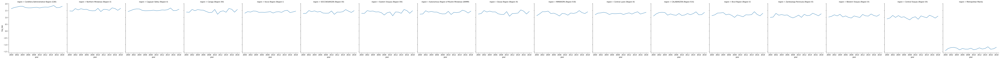

In [292]:
df = df_npp[df_npp['region'].isin(top_ave_npp.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_npp', col='region', kind='line', 
            col_order=top_ave_npp.index)

In [293]:
#  19-year average NPP share per region, highest to lowest
top_ave_npp_gr = df_npp.groupby(['region']).mean().sort_values(by='npp_gr', ascending=False)[['zone_code', 'npp_gr']]
top_ave_npp_gr

,zone_code,npp_gr
region,,
MIMAROPA (Region IV-B),12,1.567813
Zamboanga Peninsula (Region IX),17,1.465657
CALABARZON (Region IV-A),3,1.455089
Metropolitan Manila,13,1.343736
Autonomous Region of Muslim Mindanao (ARMM),1,1.225138
SOCCSKSARGEN (Region XII),15,1.162816
Central Visayas (Region VII),7,1.128260
Davao Region (Region XI),9,1.086110
Caraga (Region XIII),5,1.070987


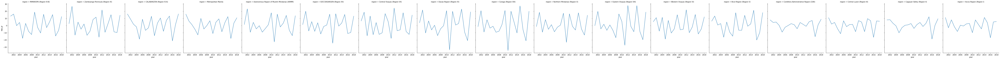

In [294]:
df = df_npp[df_npp['region'].isin(top_ave_npp_gr.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='npp_gr', col='region', kind='line', 
            col_order=top_ave_npp_gr.index)

### Sample: 2000-2008

In [295]:
df_npp_p1 = df_npp[df_npp['year'] < '2009-01-01']

In [296]:
#  Average NPP share per region, highest to lowest
top_ave_npp_p1 = df_npp_p1.groupby(['region']).mean().sort_values(by='log_npp', ascending=False)[['zone_code', 'log_npp']]
top_ave_npp_p1

,zone_code,log_npp
region,,
Cordillera Administrative Region (CAR),8,1.731839
Northern Mindanao (Region X),14,1.545815
Cagayan Valley (Region II),4,1.526877
Caraga (Region XIII),5,1.472273
Ilocos Region (Region I),11,1.392978
SOCCSKSARGEN (Region XII),15,1.380202
Eastern Visayas (Region VIII),10,1.368555
Davao Region (Region XI),9,1.350408
Autonomous Region of Muslim Mindanao (ARMM),1,1.346125


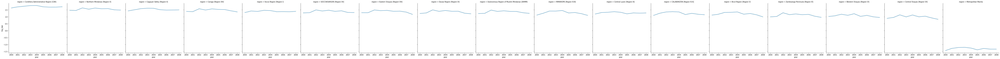

In [298]:
df = df_npp_p1[df_npp_p1['region'].isin(top_ave_npp_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_npp', col='region', kind='line', 
            col_order=top_ave_npp_p1.index)

In [299]:
#  Average NPP share per region, highest to lowest
top_ave_npp_gr_p1 = df_npp_p1.groupby(['region']).mean().sort_values(by='npp_gr', ascending=False)[['zone_code', 'npp_gr']]
top_ave_npp_gr_p1

,zone_code,npp_gr
region,,
Metropolitan Manila,13,1.330223
Cordillera Administrative Region (CAR),8,1.077532
Ilocos Region (Region I),11,1.039097
Central Luzon (Region III),6,1.010957
Cagayan Valley (Region II),4,0.904842
CALABARZON (Region IV-A),3,0.649785
SOCCSKSARGEN (Region XII),15,0.261952
Autonomous Region of Muslim Mindanao (ARMM),1,0.196701
Northern Mindanao (Region X),14,0.152784


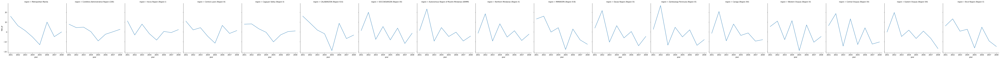

In [300]:
df = df_npp_p1[df_npp_p1['region'].isin(top_ave_npp_gr_p1.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='npp_gr', col='region', kind='line', 
            col_order=top_ave_npp_gr_p1.index)

### Sample: 2009-2018

In [301]:
df_npp_p2 = df_npp[df_npp['year'] >= '2009-01-01']

In [302]:
#  Average NPP share per region, highest to lowest
top_ave_npp_p2 = df_npp_p2.groupby(['region']).mean().sort_values(by='log_npp', ascending=False)[['zone_code', 'log_npp']]
top_ave_npp_p2

,zone_code,log_npp
region,,
Cordillera Administrative Region (CAR),8,1.757754
Northern Mindanao (Region X),14,1.578071
Cagayan Valley (Region II),4,1.543241
Caraga (Region XIII),5,1.466658
Ilocos Region (Region I),11,1.412833
SOCCSKSARGEN (Region XII),15,1.406644
Autonomous Region of Muslim Mindanao (ARMM),1,1.378135
Eastern Visayas (Region VIII),10,1.378058
Davao Region (Region XI),9,1.329458


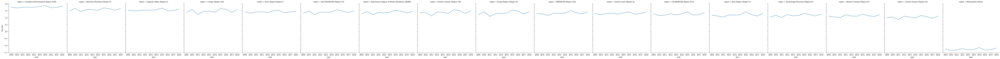

In [303]:
df = df_npp_p2[df_npp_p2['region'].isin(top_ave_npp_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='log_npp', col='region', kind='line', 
            col_order=top_ave_npp_p2.index)

In [304]:
#  Average NPP share per region, highest to lowest
top_ave_npp_gr_p2 = df_npp_p2.groupby(['region']).mean().sort_values(by='npp_gr', ascending=False)[['zone_code', 'npp_gr']]
top_ave_npp_gr_p2

,zone_code,npp_gr
region,,
Eastern Visayas (Region VIII),10,3.115558
MIMAROPA (Region IV-B),12,3.031636
Zamboanga Peninsula (Region IX),17,2.975019
Bicol Region (Region V),2,2.974277
Central Visayas (Region VII),7,2.733499
Western Visayas (Region VI),16,2.487146
Caraga (Region XIII),5,2.267848
Davao Region (Region XI),9,2.203471
CALABARZON (Region IV-A),3,2.099333


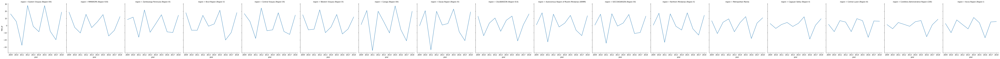

In [305]:
df = df_npp_p2[df_npp_p2['region'].isin(top_ave_npp_gr_p2.index)].set_index('year')
sns.relplot(data=df, x=df.index, y='npp_gr', col='region', kind='line', 
            col_order=top_ave_npp_gr_p2.index)

## GDP, NTL, Land Cover, and NPP

In [385]:
# Merge all dataframes
df_gdp_ntl = df_gdp.set_index(['region', 'year']).join(df_ntl.set_index(['region', 'year']), rsuffix='_r').reset_index()
df_all = df_gdp_ntl.set_index(['region', 'year']).join(df_lc.set_index(['region', 'year']), rsuffix='_r').reset_index()
df_all = df_all.set_index(['region', 'year']).join(df_npp.set_index(['region', 'year']), rsuffix='_r').reset_index()
df_all['year_int'] = pd.DatetimeIndex(df_all['year']).year
df_all

# Export to Excel
df_all.to_excel('data_for_regression_1May.xlsx', index=False)

### GDP and NTL

#### Sample: 2000-2008

In [386]:
df = df_all[df_all['year'] < '2009-01-01']

In [ ]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp'>

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_agr'>

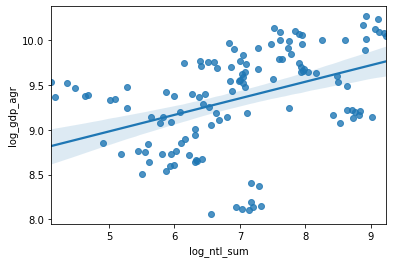

In [336]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_agr')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_ind'>

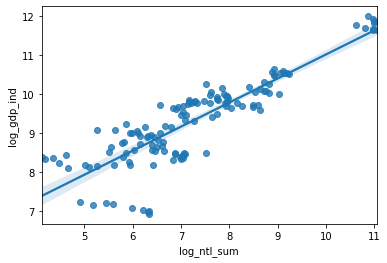

In [337]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_ind')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_svc'>

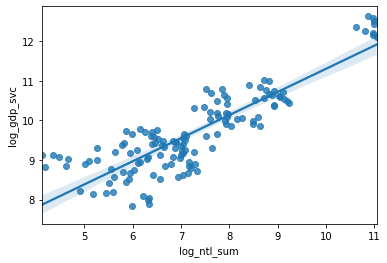

In [338]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_svc')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_non_agr'>

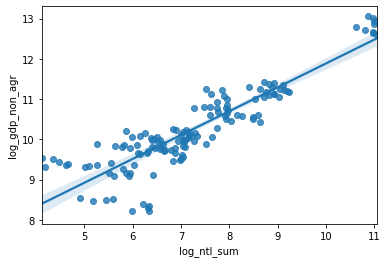

In [339]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_non_agr')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdppc'>

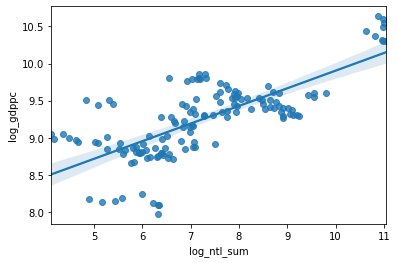

In [340]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdppc')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_gr'>

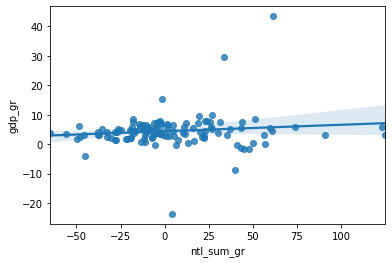

In [341]:
sns.regplot(data=df, x='ntl_sum_gr', y='gdp_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_agr_gr'>

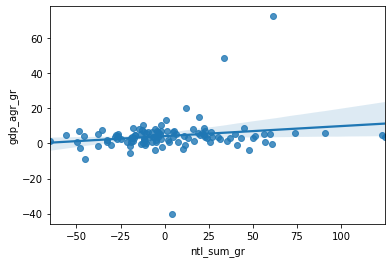

In [342]:
sns.regplot(data=df, x='ntl_sum_gr', y='gdp_agr_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_ind_gr'>

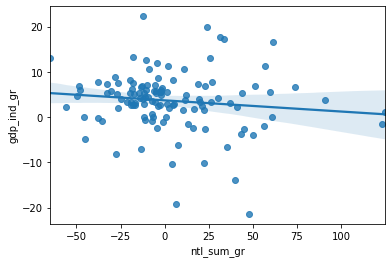

In [343]:
sns.regplot(data=df, x='ntl_sum_gr', y='gdp_ind_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_svc_gr'>

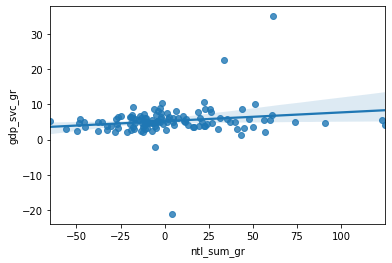

In [344]:
sns.regplot(data=df, x='ntl_sum_gr', y='gdp_svc_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_non_agr_gr'>

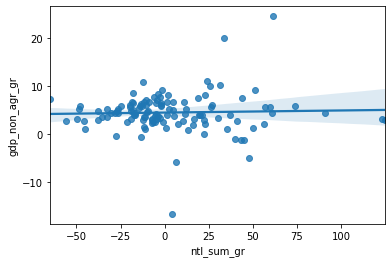

In [345]:
sns.regplot(data=df, x='ntl_sum_gr', y='gdp_non_agr_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdppc_gr'>

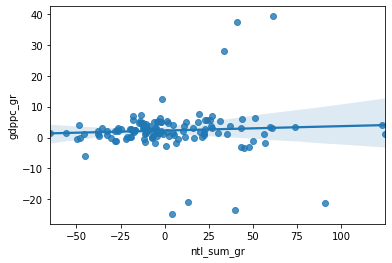

In [346]:
sns.regplot(data=df, x='ntl_sum_gr', y='gdppc_gr')

<AxesSubplot:>

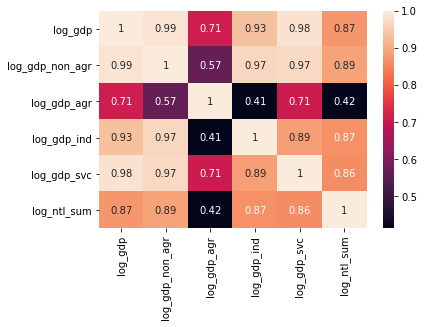

In [347]:
df1 = df[['log_gdp', 'log_gdp_non_agr', 'log_gdp_agr', 'log_gdp_ind', 'log_gdp_svc', 'log_ntl_sum']]
sns.heatmap(data=df1.corr(), annot=True)

<AxesSubplot:>

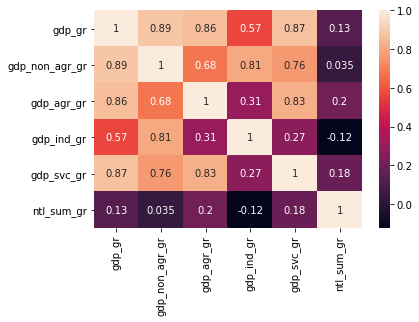

In [348]:
df1 = df[['gdp_gr', 'gdp_non_agr_gr', 'gdp_agr_gr', 'gdp_ind_gr', 'gdp_svc_gr', 'ntl_sum_gr']]
sns.heatmap(data=df1.corr(), annot=True)

#### Sample: 2009-2018

In [349]:
df = df_all[df_all['year'] >= '2009-01-01']

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp'>

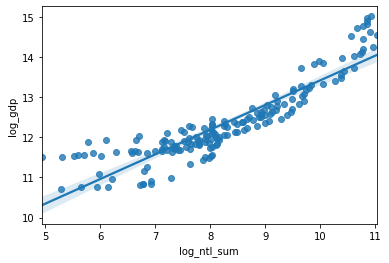

In [350]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_agr'>

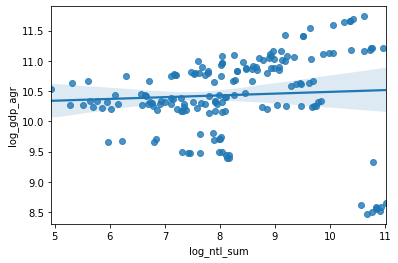

In [351]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_agr')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_ind'>

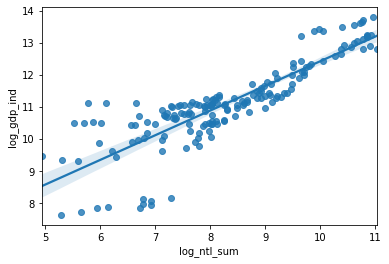

In [352]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_ind')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_svc'>

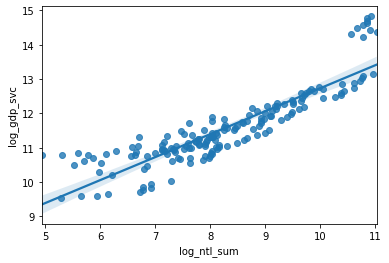

In [353]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_svc')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp_non_agr'>

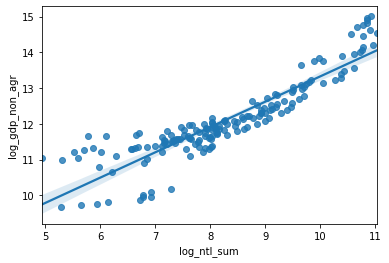

In [354]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdp_non_agr')

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdppc'>

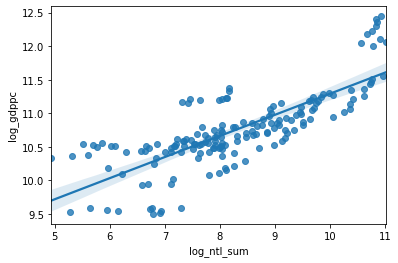

In [355]:
sns.regplot(data=df, x='log_ntl_sum', y='log_gdppc')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_gr'>

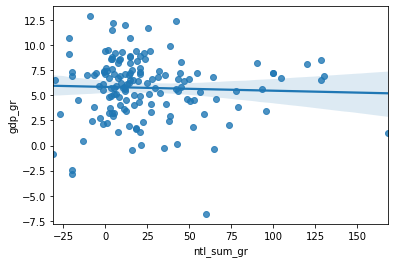

In [356]:
dfg = df_all[df_all['year'] > '2009-01-01']
sns.regplot(data=dfg, x='ntl_sum_gr', y='gdp_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_agr_gr'>

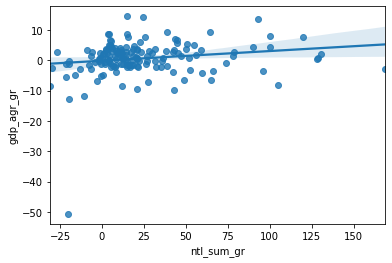

In [357]:
sns.regplot(data=dfg, x='ntl_sum_gr', y='gdp_agr_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_ind_gr'>

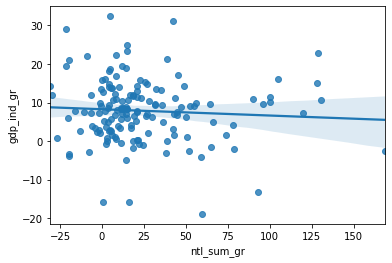

In [358]:
sns.regplot(data=dfg, x='ntl_sum_gr', y='gdp_ind_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_svc_gr'>

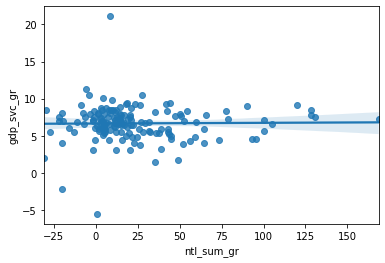

In [359]:
sns.regplot(data=dfg, x='ntl_sum_gr', y='gdp_svc_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdp_non_agr_gr'>

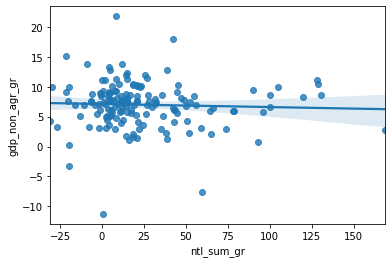

In [360]:
sns.regplot(data=dfg, x='ntl_sum_gr', y='gdp_non_agr_gr')

<AxesSubplot:xlabel='ntl_sum_gr', ylabel='gdppc_gr'>

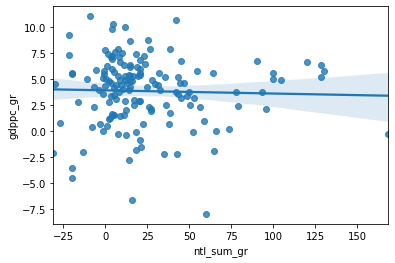

In [361]:
sns.regplot(data=dfg, x='ntl_sum_gr', y='gdppc_gr')

<AxesSubplot:>

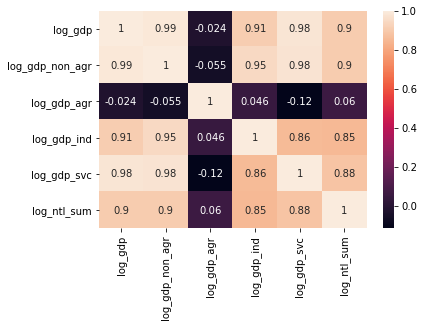

In [362]:
df1 = df[['log_gdp', 'log_gdp_non_agr', 'log_gdp_agr', 'log_gdp_ind', 'log_gdp_svc', 'log_ntl_sum']]
sns.heatmap(data=df1.corr(), annot=True)

<AxesSubplot:>

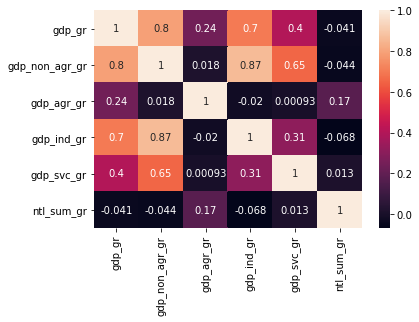

In [363]:
df1 = dfg[['gdp_gr', 'gdp_non_agr_gr', 'gdp_agr_gr', 'gdp_ind_gr', 'gdp_svc_gr', 'ntl_sum_gr']]
sns.heatmap(data=df1.corr(), annot=True)

#### 2000-08 vs 2009-18

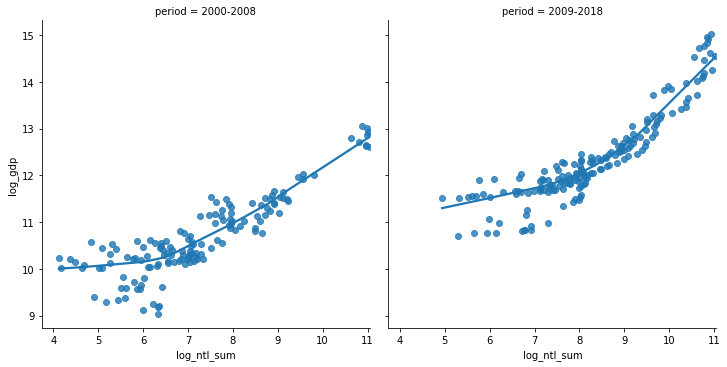

In [364]:
sns.lmplot(data=df_all, x='log_ntl_sum', y='log_gdp', col='period', lowess=True)

<AxesSubplot:xlabel='log_ntl_sum', ylabel='log_gdp'>

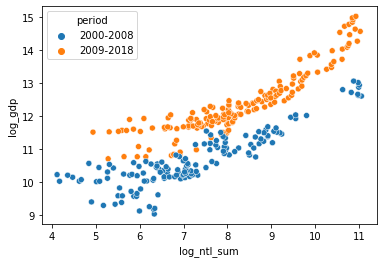

In [365]:
sns.scatterplot(data=df_all, x='log_ntl_sum', y='log_gdp', hue='period')

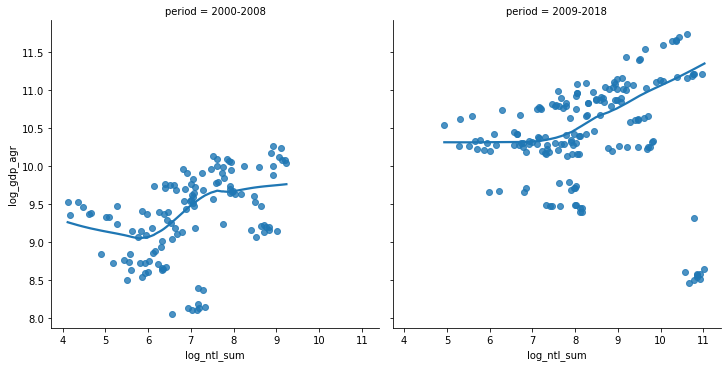

In [366]:
sns.lmplot(data=df_all, x='log_ntl_sum', y='log_gdp_agr', col='period', lowess=True)

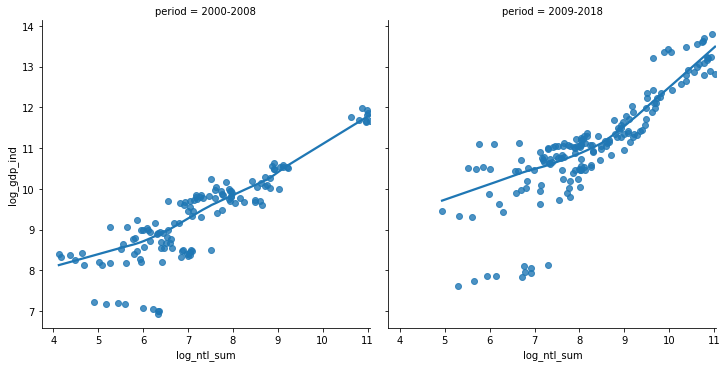

In [367]:
sns.lmplot(data=df_all, x='log_ntl_sum', y='log_gdp_ind', col='period', lowess=True)

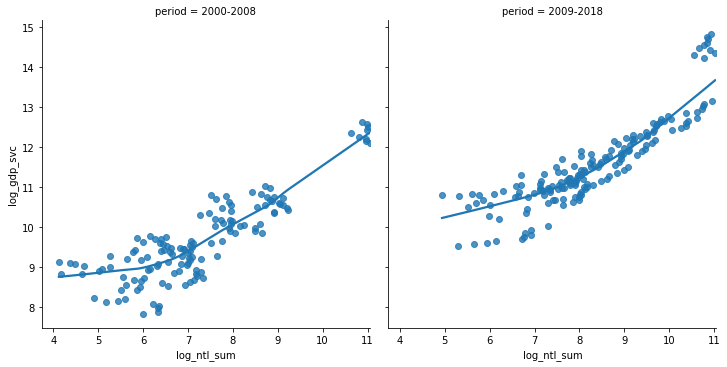

In [368]:
sns.lmplot(data=df_all, x='log_ntl_sum', y='log_gdp_svc', col='period', lowess=True)

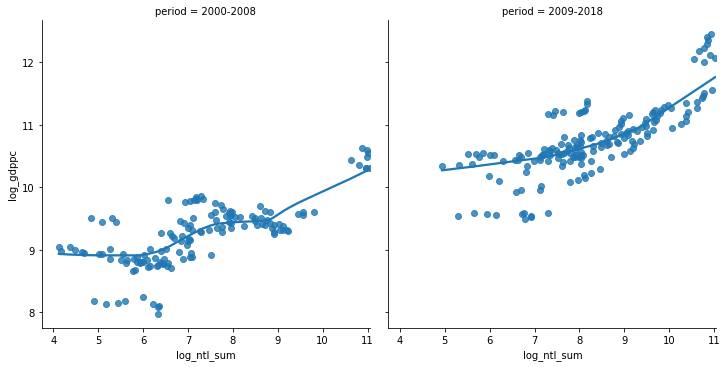

In [369]:
sns.lmplot(data=df_all, x='log_ntl_sum', y='log_gdppc', col='period', lowess=True)

### Agricultural GDP, land cover, and NPP

#### Sample: 2000-2008

In [381]:
df = df_all[df_all['year'] < '2009-01-01']

<AxesSubplot:xlabel='log_lc_c10', ylabel='log_gdp_agr'>

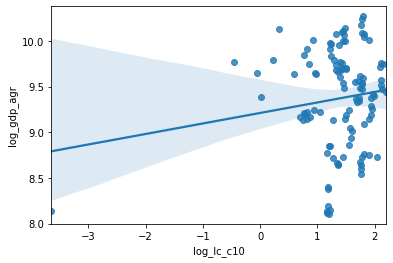

In [371]:
sns.regplot(data=df, x='log_lc_c10', y='log_gdp_agr')

<AxesSubplot:xlabel='log_lc_c12', ylabel='log_gdp_agr'>

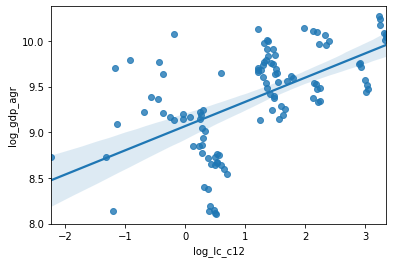

In [372]:
sns.regplot(data=df, x='log_lc_c12', y='log_gdp_agr')

C:\Users\Jesson Pagaduan\Anaconda3\lib\site-packages\numpy\core\function_base.py:144: RuntimeWarning:

invalid value encountered in multiply

C:\Users\Jesson Pagaduan\Anaconda3\lib\site-packages\numpy\core\function_base.py:154: RuntimeWarning:

invalid value encountered in add



<AxesSubplot:xlabel='log_lc_c14', ylabel='log_gdp_agr'>

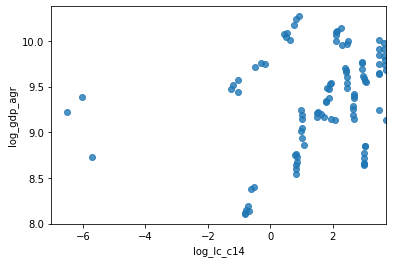

In [373]:
sns.regplot(data=df, x='log_lc_c14', y='log_gdp_agr')

<AxesSubplot:xlabel='log_lc_c10_c12', ylabel='log_gdp_agr'>

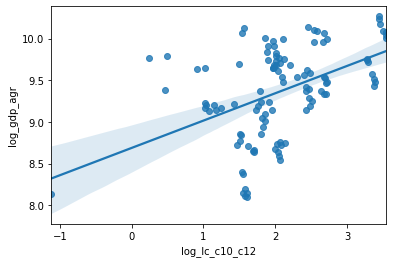

In [374]:
sns.regplot(data=df, x='log_lc_c10_c12', y='log_gdp_agr')

<AxesSubplot:xlabel='log_lc_c12_c14', ylabel='log_gdp_agr'>

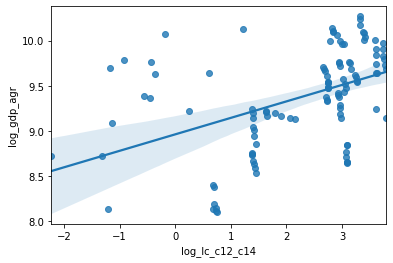

In [375]:
sns.regplot(data=df, x='log_lc_c12_c14', y='log_gdp_agr')

<AxesSubplot:xlabel='log_lc_c10_c12_c14', ylabel='log_gdp_agr'>

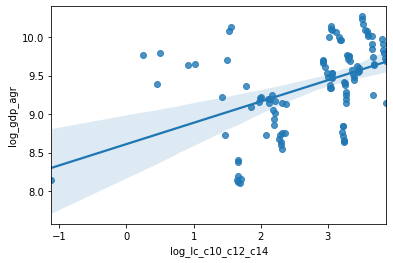

In [376]:
sns.regplot(data=df, x='log_lc_c10_c12_c14', y='log_gdp_agr')

In [383]:
df1 = df[['log_gdp_agr', 'log_lc_c10', 'log_lc_c12', 'log_lc_c14', 'log_lc_c10_c12', 
          'log_lc_c12_c14', 'log_lc_c10_c12_c14', 'log_c12_npp']]

<AxesSubplot:>

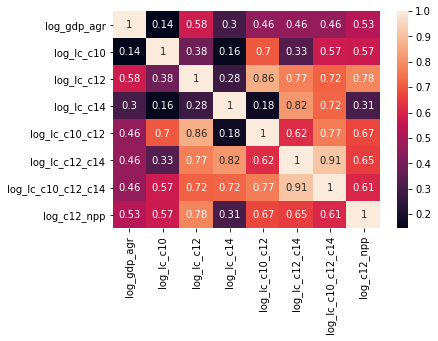

In [384]:
sns.heatmap(data=df1.corr(), annot=True)

#### Sample: 2009-2018

In [204]:
df = df_all[df_all['year'] >= '2009-01-01']

<AxesSubplot:xlabel='log_lc_c10', ylabel='log_gdp_agr'>

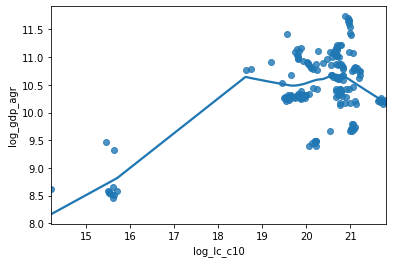

In [205]:
sns.regplot(data=df, x='log_lc_c10', y='log_gdp_agr', lowess=True)

<AxesSubplot:xlabel='log_lc_c12', ylabel='log_gdp_agr'>

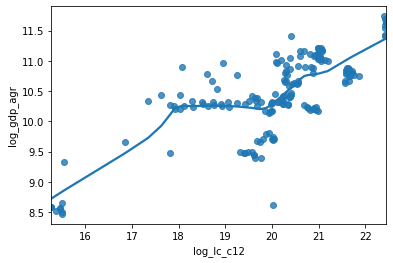

In [206]:
sns.regplot(data=df, x='log_lc_c12', y='log_gdp_agr', lowess=True)

C:\Users\Jesson Pagaduan\Anaconda3\lib\site-packages\numpy\core\function_base.py:144: RuntimeWarning:

invalid value encountered in multiply

C:\Users\Jesson Pagaduan\Anaconda3\lib\site-packages\numpy\core\function_base.py:154: RuntimeWarning:

invalid value encountered in add



<AxesSubplot:xlabel='log_lc_c14', ylabel='log_gdp_agr'>

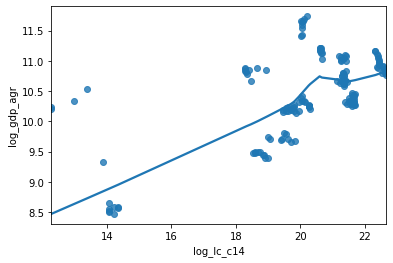

In [207]:
sns.regplot(data=df, x='log_lc_c14', y='log_gdp_agr', lowess=True)

<AxesSubplot:xlabel='log_lc_c10_c12', ylabel='log_gdp_agr'>

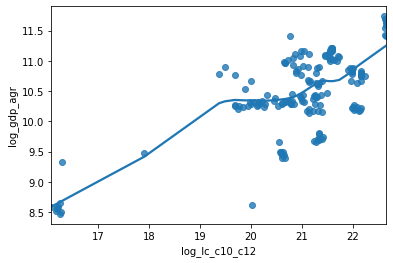

In [208]:
sns.regplot(data=df, x='log_lc_c10_c12', y='log_gdp_agr', lowess=True)

<AxesSubplot:xlabel='log_lc_c12_c14', ylabel='log_gdp_agr'>

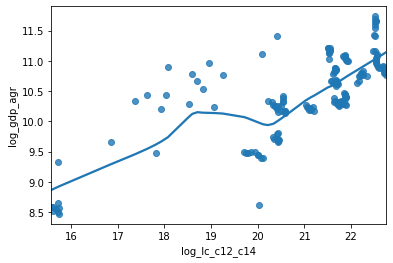

In [209]:
sns.regplot(data=df, x='log_lc_c12_c14', y='log_gdp_agr', lowess=True)

<AxesSubplot:xlabel='log_lc_c10_c12_c14', ylabel='log_gdp_agr'>

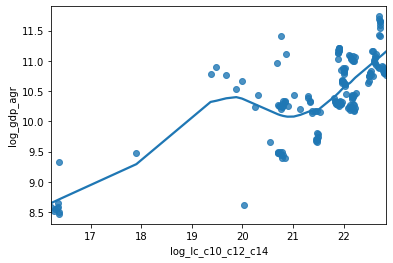

In [210]:
sns.regplot(data=df, x='log_lc_c10_c12_c14', y='log_gdp_agr', lowess=True)

In [211]:
df1 = df[['log_gdp_agr', 'log_lc_c10', 'log_lc_c12', 'log_lc_c14', 'log_lc_c10_c12', 
          'log_lc_c12_c14', 'log_lc_c10_c12_c14']]

<AxesSubplot:>

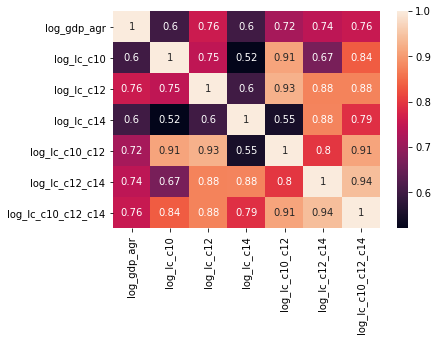

In [212]:
sns.heatmap(data=df1.corr(), annot=True)

In [214]:
df_all.to_excel('data_for_regression_20Apr.xlsx', index=False)

In [233]:
df_all

,region,year,zone_code,gdp,gdp_agr,gdp_ind,gdp_svc,gdppc,gdp_non_agr,log_gdp,...,log_lc_c10_c12,log_lc_c12_c14,log_lc_c10_c12_c14,lc_c10_gr,lc_c12_gr,lc_c14_gr,lc_c10_c12_gr,lc_c12_c14_gr,lc_c10_c12_c14_gr,year_int
0,Autonomous Region of Muslim Mindanao (ARMM),2000-01-01,1,9200.0000,5472.02900,1192.90000,2534.66500,3795.00000,3727.56500,9.126959,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000
1,Autonomous Region of Muslim Mindanao (ARMM),2001-01-01,1,8396.0000,5776.72400,1026.90000,2658.18400,2909.00000,3685.08400,9.035511,...,20.373622,21.756408,21.916392,NaN,NaN,NaN,NaN,NaN,NaN,2001
2,Autonomous Region of Muslim Mindanao (ARMM),2002-01-01,1,9696.0000,5668.87100,1092.80000,2934.66700,3271.00000,4027.46700,9.179469,...,20.376055,21.754497,21.917628,1.937472,-3.553801,0.091082,0.243605,-0.190985,0.123690,2002
3,Autonomous Region of Muslim Mindanao (ARMM),2003-01-01,1,9956.0000,5720.36400,1115.00000,3120.20000,3290.00000,4235.20000,9.205931,...,20.357351,21.753654,21.916912,0.000000,-6.243603,0.413633,-1.852977,-0.084194,-0.071521,2003
4,Autonomous Region of Muslim Mindanao (ARMM),2004-01-01,1,10481.0000,6092.07200,1147.00000,3242.29500,3383.00000,4389.29500,9.257319,...,20.290479,21.743259,21.897199,-7.127430,-4.803493,-0.749712,-6.468586,-1.034166,-1.951981,2004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318,Zamboanga Peninsula (Region IX),2014-01-01,17,146321.0000,30438.00000,52888.00000,62995.00000,39887.00000,115883.00000,11.893558,...,20.669341,21.782646,21.913784,1.673866,11.057481,-2.893518,6.850641,-0.540300,-0.273384,2014
319,Zamboanga Peninsula (Region IX),2015-01-01,17,157640.7860,31048.50300,59622.51300,66969.76900,41873.00000,126592.28200,11.968074,...,20.734460,21.790651,21.919771,-0.849708,12.366654,-1.879527,6.728591,0.803691,0.600483,2015
320,Zamboanga Peninsula (Region IX),2016-01-01,17,164866.4963,29495.90338,64328.37417,71042.21876,43042.63709,135370.59293,12.012891,...,20.842216,21.810966,21.949998,10.444563,11.990155,-0.588675,11.377627,2.052266,3.068838,2016
321,Zamboanga Peninsula (Region IX),2017-01-01,17,168806.4672,29381.18551,63799.72599,75625.55565,43326.45622,139425.28164,12.036508,...,20.792396,21.708206,21.864622,2.424830,-9.576138,-9.822352,-4.859920,-9.765625,-8.183306,2017


In [235]:
df_longdiff = df_all[df_all['year'].isin(['2000-01-01', '2008-01-01', '2009-01-01', '2018-01-01'])]

In [239]:
df_longdiff = df_longdiff[['region', 'year', 'zone_code','log_gdp', 'log_gdp_agr', 'log_gdp_ind', 
                           'log_gdp_svc', 'log_gdp_non_agr', 'log_ntl_sum']]

In [244]:
df_longdiff.pivot(index=['region', 'zone_code'], columns='year')

log_gdp             \
year                                                  2000-01-01 2008-01-01   
region                                      zone_code                         
Autonomous Region of Muslim Mindanao (ARMM) 1           9.126959   9.400878   
Bicol Region (Region V)                     2          10.207916  10.587468   
CALABARZON (Region IV-A)                    3                NaN  12.032891   
Cagayan Valley (Region II)                  4          10.026546  10.226983   
Caraga (Region XIII)                        5           9.586445   9.823686   
Central Luzon (Region III)                  6          11.376269  11.675231   
Central Visayas (Region VII)                7          11.137723  11.525763   
Cordillera Administrative Region (CAR)      8          10.115772  10.339191   
Davao Region (Region XI)                    9          11.032694  11.065513   
Eastern Visayas (Region VIII)               10         10.032145  10.306951   
Ilocos Region (Region I)                    11         10.300147  10.625417   
MIMAROPA (Region IV-B)                      12               NaN  10.565918   
Metropolitan Manila                         13         12.601706  13.055054   
Northern Mindanao (Region X)                14         10.531589  11.172307   
SOCCSKSARGEN (Region XII)                   15         10.156656  10.817716   
Western Visayas (Region VI)                 16         11.134020  11.543891   
Zamboanga Peninsula (Region IX)             17         10.205960  10.484641   

                                                                             \
year                                                  2009-01-01 2018-01-01   
region                                      zone_code                         
Autonomous Region of Muslim Mindanao (ARMM) 1          10.706229  10.977634   
Bicol Region (Region V)                     2          11.610977  12.142067   
CALABARZON (Region IV-A)                    3          13.714486  14.261796   
Cagayan Valley (Region II)                  4          11.519822  11.947600   
Caraga (Region XIII)                        5          10.972877  11.569032   
Central Luzon (Region III)                  6          13.048508  13.714608   
Central Visayas (Region VII)                7          12.617795  13.294382   
Cordillera Administrative Region (CAR)      8          11.633310  12.013046   
Davao Region (Region XI)                    9          12.234198  12.901282   
Eastern Visayas (Region VIII)               10         11.894228  12.127796   
Ilocos Region (Region I)                    11         12.034252  12.577174   
MIMAROPA (Region IV-B)                      12         11.534168  11.873471   
Metropolitan Manila                         13         14.456614  15.013065   
Northern Mindanao (Region X)                14         12.196618  12.752097   
SOCCSKSARGEN (Region XII)                   15         11.905440  12.415889   
Western Visayas (Region VI)                 16         12.289871  12.828980   
Zamboanga Peninsula (Region IX)             17         11.656255  12.097243   

                                                      log_gdp_agr             \
year                                                   2000-01-01 2008-01-01   
region                                      zone_code                          
Autonomous Region of Muslim Mindanao (ARMM) 1            8.607405   8.850784   
Bicol Region (Region V)                     2            9.077003   9.417131   
CALABARZON (Region IV-A)                    3                 NaN        NaN   
Cagayan Valley (Region II)                  4            9.364561   9.536908   
Caraga (Region XIII)                        5            8.509749   8.747978   
Central Luzon (Region III)                  6            9.887979  10.268135   
Central Visayas (Region VII)                7            9.073710   9.222852   
Cordillera Administrative Region (CAR)      8            8.059012   8.400496   
Davao Region (R